<center>   <h2> Earthquakes in Turkey <h/2> </center>

❓ Are there any trends in the frequency or magnitude of earthquakes in Turkey over time?

❓ Are there any spatial patterns or clustering of earthquakes in Turkey?

❓ Which towns and cities are most affected by earthquakes in Turkey?





 <small>
 Identify high-risk zones and plan for earthquake preparedness and mitigation strategies. This can help in building more resilient and sustainable cities and communities that are better equipped to handle natural disasters.

-----------------------------------------------------------------------------------------------------------------------------------
##### "How do earthquakes impact progress towards achieving UN SDG 11 (Sustainable Cities and Communities) in Turkey, and how can disaster risk reduction strategies be implemented to mitigate the impact of earthquakes on sustainable development?"
 
<u> The project aims to provide insights into the risk of seismic events in different parts of Turkey and identify the areas that are most vulnerable to earthquakes.</u>

* The data used in the project comes from various sources, including the United States Geological Survey (USGS) and the Turkish Statistical Institute (TÜİK).

* The analysis focuses on the frequency and magnitude of earthquakes in different regions of the country and the population density of each town in Turkey.

* A new metric was created based on the population and earthquake frequency for each town to help identify the areas that are most at risk. The metric takes into account both the population density and the frequency of earthquakes in each town, providing a measure of the overall seismic risk.

* The project provides useful information for government agencies responsible for disaster management and urban planning, non-governmental organizations working on earthquake preparedness and response, and researchers and academics studying earthquake risk in Turkey.


<center> <b>Disasters can have wide-ranging impacts on sustainable development.</b> </center>


</small>

-----------------------------------------------------------------------------------------------------------------------------------

 
<small> 

* _Data acquisition_: Source of data is the global earthquake catalog maintained by the United States Geological Survey (USGS).

* _Data cleaning and preprocessing_

* _Exploratory data analysis_

* _Visualization_

* _Conclusion_

</small>


<center> <img src="images/eqswhere.png" width="50%" /> <center>


<center> <p> 

_Reference_: https://yunus.hacettepe.edu.tr/~kdirik/IMU233_9_earthquakes.pdf </p> <center>

<center>Libraries</center>


In [297]:
import pandas as pd
import os
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import missingno as msno
from geopy.geocoders import Nominatim
from statsmodels.tsa.seasonal import seasonal_decompose
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from pandas.plotting import autocorrelation_plot
from folium.plugins import HeatMap


<center> Merge files    </center>

In [298]:

csvs_path = 'queries/'
csvs = [csvs_path + f for f in os.listdir(csvs_path) if f.endswith('.csv')]
df = pd.concat([pd.read_csv(f) for f in csvs])
df.to_csv('data/merged.csv', index=False)

<center> Load the data </center>

* [35.568, 42.391] Latitude
* [25.444, 45] Longitude

In [299]:
df = pd.read_csv('data/merged.csv', parse_dates=['time'], index_col='time')
df2 = pd.read_csv('data/eqs_socioeco.tsv', sep='\t')
#Drop 1st row and 1st column
df2 = df2.drop(df2.index[0])
df2 = df2.drop(df2.columns[0], axis=1)

#Open xls file
df3 = pd.read_excel('data/turkey_damage.xls', header=1)

#Load towns population data
towns = pd.read_excel("data/ilceler-nüfus.xlsx", header=1)

#Load towns coordinates
towns_coords = pd.read_excel("data/tr.xlsx", header=0)

<center> Obtain only the earthquakes in Turkey </center>

In [300]:
#Lat-long coorditates for cities in Turkey are in range: Latitude from 35.9025 to 42.02683 and longitude from 25.90902 to 44.5742.
#We will use these coordinates to filter the data.

df = df[(df['latitude'] >= 35.9025) & (df['latitude'] <= 42.02683) & (df['longitude'] >= 25.90902) & (df['longitude'] <= 44.5742)]

<center>Observe the data </center>

In [301]:
df.shape

(19946, 21)

In [302]:
df2.shape

(154, 38)

In [303]:
df3.shape

(241, 215)

In [304]:
df.head(3) #order is wrong

,latitude,longitude,depth,mag,magType,nst,gap,dmin,rms,net,...,updated,place,type,horizontalError,depthError,magError,magNst,status,locationSource,magSource
time,,,,,,,,,,,,,,,,,,,,,
1922-08-29 03:36:02.050000+00:00,36.757,33.179,15.0,5.76,mw,NaN,NaN,NaN,NaN,iscgem,...,2022-04-25T23:41:42.116Z,"26 km WNW of Mut, Turkey",earthquake,NaN,25.0,0.2,NaN,reviewed,iscgem,iscgem
1921-09-26 09:26:04.670000+00:00,38.956,33.046,15.0,6.01,mw,NaN,NaN,NaN,NaN,iscgem,...,2022-04-25T21:14:26.665Z,"15 km S of Kulu, Turkey",earthquake,NaN,6.7,0.2,NaN,reviewed,iscgem,iscgem
1921-01-27 11:30:24.850000+00:00,36.850,27.992,15.0,5.54,mw,NaN,NaN,NaN,NaN,iscgem,...,2022-04-25T23:42:50.179Z,"21 km WNW of ?çmeler, Turkey",earthquake,NaN,5.8,0.2,NaN,reviewed,iscgem,iscgem


In [305]:
#reorder the index
df = df.sort_index()


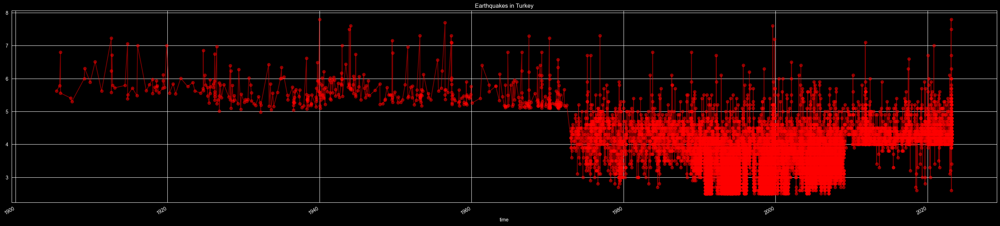

In [306]:
#Confirm with a plot
df['mag'].plot(figsize=(36,8), title='Earthquakes in Turkey', color='red', alpha=0.5, marker='o', linestyle='-');

* <small>Numerical Data</small>

In [307]:
numerical_data = df.select_dtypes(include = [np.number]) 
numerical_data.head()

,latitude,longitude,depth,mag,nst,gap,dmin,rms,horizontalError,depthError,magError,magNst
time,,,,,,,,,,,,
1905-05-20 11:06:10.250000+00:00,40.162,39.397,15.0,5.62,NaN,NaN,NaN,NaN,NaN,4.8,0.45,NaN
1905-10-22 03:54:31.710000+00:00,40.761,28.183,15.0,5.78,NaN,NaN,NaN,NaN,NaN,3.9,0.52,NaN
1905-12-04 07:05:30.550000+00:00,38.153,38.645,10.0,6.80,NaN,NaN,NaN,NaN,NaN,4.9,0.72,NaN
1905-12-04 12:20:07.960000+00:00,37.216,38.830,15.0,5.56,NaN,NaN,NaN,NaN,NaN,5.6,0.63,NaN
1907-03-31 14:14:47.310000+00:00,36.433,43.710,15.0,5.41,NaN,NaN,NaN,NaN,NaN,25.0,0.20,NaN


In [308]:
print("Info: ")
df.info()

Info: 
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 19946 entries, 1905-05-20 11:06:10.250000+00:00 to 2023-03-19 12:54:24.779000+00:00
Data columns (total 21 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   latitude         19946 non-null  float64
 1   longitude        19946 non-null  float64
 2   depth            19946 non-null  float64
 3   mag              19946 non-null  float64
 4   magType          19945 non-null  object 
 5   nst              5978 non-null   float64
 6   gap              5912 non-null   float64
 7   dmin             1299 non-null   float64
 8   rms              12040 non-null  float64
 9   net              19946 non-null  object 
 10  id               19946 non-null  object 
 11  updated          19946 non-null  object 
 12  place            19916 non-null  object 
 13  type             19946 non-null  object 
 14  horizontalError  1373 non-null   float64
 15  depthError       2858 non-null   flo

In [309]:
print("Describe: ")
df.describe()

Describe: 


,latitude,longitude,depth,mag,nst,gap,dmin,rms,horizontalError,depthError,magError,magNst
count,19946.000000,19946.000000,19946.000000,19946.000000,5978.000000,5912.000000,1299.000000,12040.000000,1373.000000,2858.000000,1890.000000,3868.000000
mean,38.797380,29.806305,14.838591,3.422214,30.579625,116.875321,0.867303,0.758262,4.311959,5.298684,0.168471,19.707859
std,1.387277,4.219308,17.815894,0.755483,57.081836,63.563765,0.432674,0.363817,1.196258,5.616616,0.103931,26.448186
min,35.904000,25.910000,0.000000,2.500000,4.000000,13.000000,0.063000,0.000000,1.300000,0.000000,0.024000,1.000000
25%,37.893550,27.479250,10.000000,2.800000,5.000000,61.675000,0.587000,0.500000,3.510000,1.901000,0.090250,5.000000
50%,39.089000,28.288000,10.000000,3.200000,10.000000,107.000000,0.815000,0.710000,4.400000,4.100000,0.149000,12.500000
75%,39.672000,29.789000,11.600000,3.900000,32.000000,166.500000,1.068000,1.000000,5.100000,6.000000,0.200000,26.000000
max,42.008000,44.574000,176.100000,7.800000,706.000000,346.400000,3.822000,2.540000,8.890000,70.800000,0.850000,647.000000


In [310]:
print("Describe df3: ")
df3.describe()

Describe df3: 


,Code,DataCards,Deaths,Injured,Missing,Houses Destroyed,Houses Damaged,Directly affected,Indirectly Affected,Relocated,...,Loss: Apiculture,Total: Apiculture,Damaged: Chickens,Destroyed: Chickens,Loss: Chickens,Total: Chickens,Damaged: Roads,Destroyed: Roads,Loss: Roads,Total: Roads
count,240.000000,241.000000,133.000000,65.000000,0.0,12.000000,1.740000e+02,2.0,1.000000e+01,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
mean,32.333333,2.041494,1414.751880,2424.769231,NaN,10297.166667,1.414378e+04,2777.0,3.185486e+06,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,19.848941,15.781263,8736.952891,11088.983136,NaN,20032.958633,9.582666e+04,0.0,6.686456e+06,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,1.000000,1.000000,1.000000,2.000000,NaN,1.000000,1.000000e+00,2777.0,3.000000e+00,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,16.000000,1.000000,5.000000,17.000000,NaN,86.000000,2.985000e+02,2777.0,8.190000e+02,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,31.000000,1.000000,23.000000,75.000000,NaN,598.500000,9.925000e+02,2777.0,5.697000e+03,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,48.000000,1.000000,161.000000,349.000000,NaN,6501.250000,4.080250e+03,2777.0,6.715100e+04,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
max,81.000000,246.000000,94081.000000,78805.000000,NaN,61783.000000,1.230509e+06,2777.0,1.592743e+07,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


<p>Covariance reveals how two variables change together while correlation determines how closely two variables are related to each other.
Covariance shows you how the two variables differ, whereas correlation shows you how the two variables are related.</p>

Text(0.5, 1.0, 'Correlation between features')

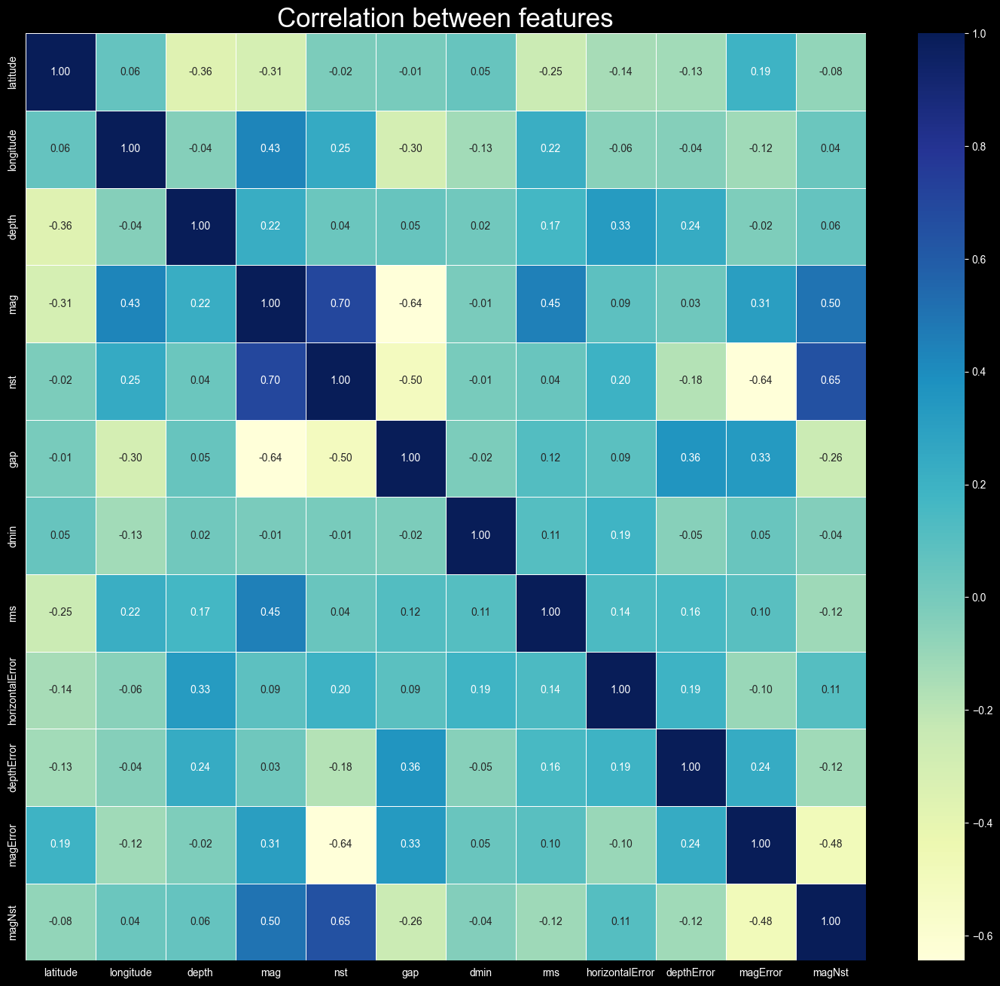

In [311]:
#Check correlation between variables except for the time, longitude and latitude 
#Use sns

corr = numerical_data.corr()
plt.figure(figsize=(18, 16))
sns.heatmap(corr,
            xticklabels=corr.columns.values,
            yticklabels=corr.columns.values,
            annot=True,
            linewidths=.5,
            cmap="YlGnBu",
            fmt= '.2f')
plt.title('Correlation between features', fontsize=25)





In [312]:
#Check covariance between variables except for the longitude and latitude
#A high covariance shows a strong relationship between two variables, whereas a low covariance shows a weak relationship.
print("Covariance: ")
df_cov = df.drop(['longitude', 'latitude'], axis=1)
df_cov.cov(numeric_only=True).style.background_gradient(cmap='coolwarm', axis=None, low=0.5, high=0.5).set_caption('Covariance between features').set_precision(2)



Covariance: 


,depth,mag,nst,gap,dmin,rms,horizontalError,depthError,magError,magNst
depth,317.41,3.02,45.50,64.96,0.19,1.13,8.72,45.13,-0.05,47.24
mag,3.02,0.57,24.96,-26.92,-0.00,0.12,0.04,0.12,0.02,5.35
nst,45.50,24.96,3258.34,-1839.91,-0.12,0.99,9.16,-58.94,-1.77,1015.49
gap,64.96,-26.92,-1839.91,4040.35,-0.23,1.23,3.21,53.72,0.72,-282.11
dmin,0.19,-0.00,-0.12,-0.23,0.19,0.01,0.09,-0.04,0.00,-0.54
rms,1.13,0.12,0.99,1.23,0.01,0.13,0.04,0.20,0.00,-0.85
horizontalError,8.72,0.04,9.16,3.21,0.09,0.04,1.43,0.46,-0.01,4.55
depthError,45.13,0.12,-58.94,53.72,-0.04,0.20,0.46,31.55,0.12,-15.26
magError,-0.05,0.02,-1.77,0.72,0.00,0.00,-0.01,0.12,0.01,-1.27
magNst,47.24,5.35,1015.49,-282.11,-0.54,-0.85,4.55,-15.26,-1.27,699.51


In [313]:
#A standard deviation (or σ) is a measure of how dispersed the data is in relation to the mean.
print("Standard Deviation: ")
df_std = df.drop(['longitude', 'latitude'], axis=1)
pd.DataFrame(df_std.std(numeric_only=True), columns=['Standard Deviation']).style.background_gradient(cmap='coolwarm', axis=None, low=0.5, high=0.5)

Standard Deviation: 


,Standard Deviation
depth,17.815894
mag,0.755483
nst,57.081836
gap,63.563765
dmin,0.432674
rms,0.363817
horizontalError,1.196258
depthError,5.616616
magError,0.103931
magNst,26.448186


In [314]:
print("Columns: ")
df.columns


Columns: 


Index(['latitude', 'longitude', 'depth', 'mag', 'magType', 'nst', 'gap',
       'dmin', 'rms', 'net', 'id', 'updated', 'place', 'type',
       'horizontalError', 'depthError', 'magError', 'magNst', 'status',
       'locationSource', 'magSource'],
      dtype='object')

Missing Values: 


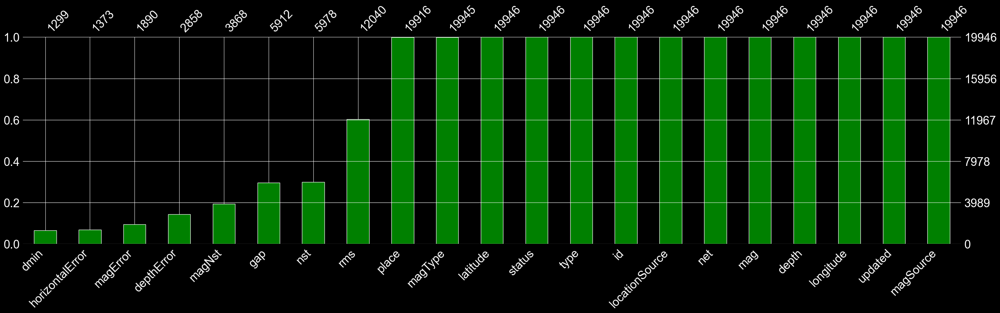

In [315]:
print("Missing Values: ")
msno.bar(df, figsize=(36, 8), color='green', fontsize=25, labels=True, sort="ascending");

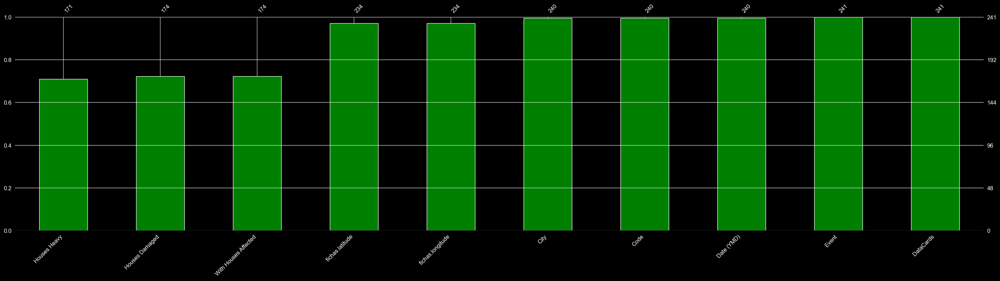

In [316]:
#There are so many missing values in df3. We will drop the columns with more than 30% missing values.
df3 = df3.dropna(thresh=len(df3)*0.7, axis=1)

    
msno.bar(df3, figsize=(36, 8), color='green', fontsize=12, labels=True, sort="ascending");

In [317]:
print("Duplicate Values: ")
df.duplicated().sum()
    

Duplicate Values: 


19

Outliers: 


(array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9]),
 [Text(0, 0, 'depth'),
  Text(0, 1, 'mag'),
  Text(0, 2, 'nst'),
  Text(0, 3, 'gap'),
  Text(0, 4, 'dmin'),
  Text(0, 5, 'rms'),
  Text(0, 6, 'horizontalError'),
  Text(0, 7, 'depthError'),
  Text(0, 8, 'magError'),
  Text(0, 9, 'magNst')])

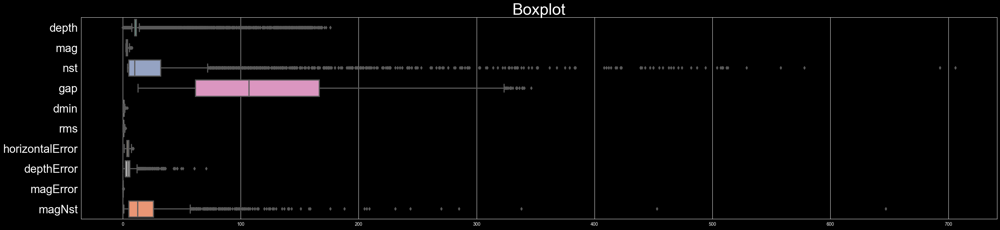

In [318]:
print("Outliers: ")
#Outliers are data points that are distant from other observations.


#Drop the longitude and latitude columns
df_box = df.drop(['longitude', 'latitude'], axis=1)
#Boxplot
plt.figure(figsize=(36, 8))
sns.boxplot(data=df_box, orient="h", palette="Set2", linewidth=2.5)
plt.title('Boxplot', fontsize=35)
plt.yticks(fontsize=25)



<small>Problems with the data:

* Missing values
* Duplicate values
* City and town names can be extracted from the place column
<small/>


<center>Prepare the data    </center>

In [319]:
#Define categorical variables
categorical_columns = [col for col in df.columns if df[col].dtype == 'object']

#Define numerical variables
numerical_columns = [col for col in df.columns if df[col].dtype in ['int64', 'float64']]


In [320]:
#Check the number of unique values in each categorical variable
df[categorical_columns].nunique()

magType              10
net                   3
id                19927
updated           19797
place             12955
type                  3
status                1
locationSource       15
magSource            22
dtype: int64

In [321]:
#Fill the missing categorical data with 'Unknown'
for col in categorical_columns:
    df[col] = df[col].fillna('Unknown')


#Fill the missing numerical data with the mean
for col in numerical_columns:
    df[col] = df[col].fillna(df[col].mean())

<center>Check for missing values again  </center>


In [322]:
#Drop duplicates
df = df.drop_duplicates()
df.duplicated().sum()

0

Missing Values: 


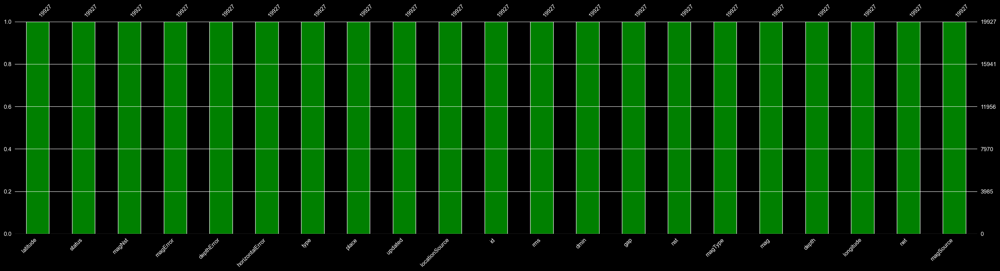

In [323]:
print("Missing Values: ")
msno.bar(df, figsize=(36, 8), color='green', fontsize=12, labels=True, sort="ascending");

In [324]:
#Extract city names from the latitude and longitude coordinates
df['country'] = df['place'].str.split(',').str[1]


In [325]:
# initialize Nominatim API
geolocator = Nominatim(user_agent="geoapiExercises")

In [326]:
#This cell takes a long time to run so I commented it out. I saved the output in a csv file and read it again.

#latitudes = df['latitude']
#longitudes = df['longitude']



    
## create location column
#df['location'] = list(zip(latitudes, longitudes))


#df['loc'] = df['location'].apply(geolocator.reverse)


#latitudes = df2['Latitude']
#longitudes = df2['Longitude']

# create location column
#df2['location'] = list(zip(latitudes, longitudes))

#df2['loc'] = df2['location'].apply(geolocator.reverse)



In [327]:
#save the dataframe to a csv file
#df.to_csv('earthquakes.csv', index=True)

#save the dataframe to a csv file
#df2.to_csv('cities_se.csv', index=True)

In [328]:
eq = pd.read_csv('data/earthquakes.csv')
eq.columns


Index(['time', 'latitude', 'longitude', 'depth', 'mag', 'magType', 'nst',
       'gap', 'dmin', 'rms', 'net', 'id', 'updated', 'place', 'type',
       'horizontalError', 'depthError', 'magError', 'magNst', 'status',
       'locationSource', 'magSource', 'country', 'location', 'loc'],
      dtype='object')

In [329]:
#Examine the new loc column
eq['loc'].head(10)

0    Özyurt, Kelkit, Gümüşhane, Karadeniz Bölgesi, ...
1                   Tekirdağ, Marmara Bölgesi, Türkiye
2    Başmezra, Pütürge, Malatya, Doğu Anadolu Bölge...
3    Güzelyurt Mahallesi, Şanlıurfa, Haliliye, Şanl...
4    Daretû, دارەتوو, ناحیەی دارەتوو, شارۆچکەی بەرد...
5    Uğurlu, Baykan, Siirt, Güneydoğu Anadolu Bölge...
6                                                Ελλάς
7    İsaklı, Ortakent, Suşehri, Sivas, İç Anadolu B...
8    Bahçelievler Mahallesi, Çeltik, Konya, İç Anad...
9           Oğuzlar, Çorum, Karadeniz Bölgesi, Türkiye
Name: loc, dtype: object

In [330]:
eq.isna().sum()

time                 0
latitude             0
longitude            0
depth                0
mag                  0
magType              0
nst                  0
gap                  0
dmin                 0
rms                  0
net                  0
id                   0
updated              0
place                0
type                 0
horizontalError      0
depthError           0
magError             0
magNst               0
status               0
locationSource       0
magSource            0
country            508
location             0
loc                356
dtype: int64

In [331]:
#356 rows have missing values in the loc column
#fill them with Unknown
eq['loc'] = eq['loc'].fillna('Unknown')

In [332]:
#Take only the rows containing the word 'Turkey' in somewhere in the loc column
eq_tr = eq["loc"].str.contains("Türkiye")

eq = eq[eq_tr == True]


In [333]:
eq.shape

(16929, 25)

In [334]:
eq['loc'].head(10)

0     Özyurt, Kelkit, Gümüşhane, Karadeniz Bölgesi, ...
1                    Tekirdağ, Marmara Bölgesi, Türkiye
2     Başmezra, Pütürge, Malatya, Doğu Anadolu Bölge...
3     Güzelyurt Mahallesi, Şanlıurfa, Haliliye, Şanl...
5     Uğurlu, Baykan, Siirt, Güneydoğu Anadolu Bölge...
7     İsaklı, Ortakent, Suşehri, Sivas, İç Anadolu B...
8     Bahçelievler Mahallesi, Çeltik, Konya, İç Anad...
9            Oğuzlar, Çorum, Karadeniz Bölgesi, Türkiye
10                  Kızlan, Datça, Ege Bölgesi, Türkiye
11    Bulgur, Şarköy, Tekirdağ, Marmara Bölgesi, Tür...
Name: loc, dtype: object

In [335]:
#Now extract the city names from the loc column
cities =  ["Adana", "Adıyaman","Afyonkarahisar", "Ağrı","Aksaray","Amasya","Ankara","Antalya","Ardahan","Artvin","Aydın","Balıkesir","Bartın","Batman","Bayburt","Bilecik","Bingöl",
 "Bitlis","Bolu","Burdur","Bursa","Çanakkale","Çankırı","Çorum","Denizli","Diyarbakır","Düzce","Edirne","Elazığ","Erzincan","Erzurum","Eskişehir",
 "Gaziantep","Giresun","Gümüşhane","Hakkâri","Hatay","Iğdır","Isparta","İstanbul","İzmir","Kahramanmaraş","Karabük","Karaman","Kars","Kastamonu","Kayseri","Kilis",
 "Kırıkkale","Kırklareli","Kırşehir","Kocaeli","Konya","Kütahya","Malatya","Manisa","Mardin","Mersin","Muğla","Muş","Nevşehir","Niğde","Ordu","Osmaniye", "Rize","Sakarya","Samsun","Şanlıurfa",
 "Siirt","Sinop","Sivas","Şırnak","Tekirdağ","Tokat","Trabzon","Tunceli","Uşak","Van","Yalova","Yozgat","Zonguldak"]


In [336]:
#if the loc column contains any of the cities in the cities list, extract the city name
#The next() function returns the next item in an iterator.
#You can add a default return value, to return if the iterable has reached to its end.
eq['city'] = eq['loc'].apply(lambda x: next((city for city in cities if city in x), None))



In [337]:
#There are 'Merkez' values in the "İLÇELER" column in towns. We will replace them with the value in "City" column + 'Merkez'
for i in towns.index:
    if towns.loc[i, 'İLÇE'] == 'Merkez':
        towns.loc[i, 'İLÇE'] = towns.loc[i, 'İL ADI'] + 'Merkez'
   
    
towns['İLÇE'].value_counts()

Yenişehir    3
Yeşilyurt    2
Köprübaşı    2
Kemer        2
Ayvacık      2
            ..
Han          1
İnönü        1
Mahmudiye    1
Mihalgazi    1
Yığılca      1
Name: İLÇE, Length: 948, dtype: int64

In [338]:
#Extract the town names from the loc column
 
#Before doing that, create a list from towns "İLÇE" column
ilceler = towns['İLÇE'].tolist()
ilceler = [x.lower() for x in ilceler]
ilceler = [x.capitalize() for x in ilceler]
ilceler



['Aladağ',
 'Ceyhan',
 'Çukurova',
 'Feke',
 'İmamoğlu',
 'Karaisalı',
 'Karataş',
 'Kozan',
 'Pozantı',
 'Saimbeyli',
 'Sarıçam',
 'Seyhan',
 'Tufanbeyli',
 'Yumurtalık',
 'Yüreğir',
 'Adiyamanmerkez',
 'Besni',
 'Çelikhan',
 'Gerger',
 'Gölbaşı',
 'Kahta',
 'Samsat',
 'Sincik',
 'Tut',
 'Afyonkarahi̇sarmerkez',
 'Başmakçı',
 'Bayat',
 'Bolvadin',
 'Çay',
 'Çobanlar',
 'Dazkırı',
 'Dinar',
 'Emirdağ',
 'Evciler',
 'Hocalar',
 'İhsaniye',
 'İscehisar',
 'Kızılören',
 'Sandıklı',
 'Sinanpaşa',
 'Sultandağı',
 'Şuhut',
 'Ağrimerkez',
 'Diyadin',
 'Doğubayazıt',
 'Eleşkirt',
 'Hamur',
 'Patnos',
 'Taşlıçay',
 'Tutak',
 'Amasyamerkez',
 'Göynücek',
 'Gümüşhacıköy',
 'Hamamözü',
 'Merzifon',
 'Suluova',
 'Taşova',
 'Akyurt',
 'Altındağ',
 'Ayaş',
 'Bala',
 'Beypazarı',
 'Çamlıdere',
 'Çankaya',
 'Çubuk',
 'Elmadağ',
 'Etimesgut',
 'Evren',
 'Gölbaşı',
 'Güdül',
 'Haymana',
 'Kahramankazan',
 'Kalecik',
 'Keçiören',
 'Kızılcahamam',
 'Mamak',
 'Nallıhan',
 'Polatlı',
 'Pursaklar',
 'Sinca

In [339]:
# ilceler has values such as 'güney' 'akdeniz' 'marmara' values. I will replace them with the value in the city column + 'İlçesi'

ilceler = [x.replace('Güney', 'Güney İlçesi') for x in ilceler]
ilceler = [x.replace('Akdeniz', 'Akdeniz İlçesi') for x in ilceler]
ilceler = [x.replace('Marmara', 'Marmara İlçesi') for x in ilceler]

In [340]:

eq["town"] = eq["loc"].apply(lambda x: next((ilce for ilce in ilceler if ilce in x), None))

eq["town"].value_counts()

eq["town"].isna().sum()

3856

In [341]:
#Check the rows with missing values in the town column
eq[eq["town"].isna() == True]

#Empty ones are villages or its city columns is also empty. I will fill them with the value in the city column + 'village'

eq["town"] = eq["town"].fillna(eq["city"] + 'village')


eq["town"].isna().sum()

777

In [342]:
eq.shape    

(16929, 27)

<center> City-wise distribution of earthquakes </center>

In [343]:
eq["city"].value_counts()

Manisa       2760
Kütahya      1808
Balıkesir    1313
İzmir         684
Muğla         576
             ... 
Artvin          3
Sinop           3
Batman          2
Kilis           2
Nevşehir        1
Name: city, Length: 79, dtype: int64

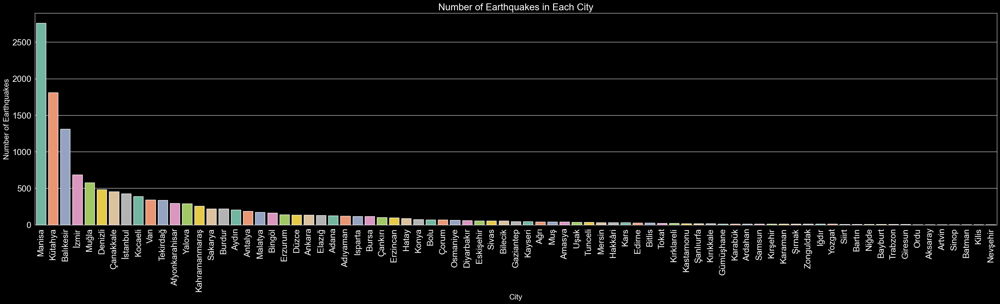

In [344]:
#Visualize the number of earthquakes in each city
plt.figure(figsize=(36, 8))
sns.countplot(x='city', data=eq, palette="Set2", order=eq['city'].value_counts().index)
plt.xticks(rotation=90, fontsize=18)
plt.yticks(fontsize=18)
plt.title('Number of Earthquakes in Each City', fontsize=20)
plt.xlabel('City', fontsize=16)
plt.ylabel('Number of Earthquakes', fontsize=16)
plt.show()

Proportion of types of earthquakes

In [345]:
eq["type"].value_counts()

earthquake    16927
rock burst        1
explosion         1
Name: type, dtype: int64

<img src="images/mag_ranges.png" width="50%" />

<p> 

_Reference_: https://yunus.hacettepe.edu.tr/~kdirik/IMU233_9_earthquakes.pdf </p>

In [346]:
def richter_scale(magnitude):
    if magnitude < 1.9:
        return 'Micro'
    elif magnitude < 2.9:
        return 'Very Minor'
    elif magnitude < 3.9:
        return 'Minor'
    elif magnitude < 4.9:
        return 'Light'
    elif magnitude < 5.9:
        return 'Moderate'
    elif magnitude < 6.9:
        return 'Strong'
    elif magnitude < 7.9:
        return 'Major'
    elif magnitude < 8.9:
        return 'Great'
    else:
        return 'Meteoric'

eq['Richter Scale'] = eq['mag'].apply(richter_scale)

    

In [347]:
eq['Richter Scale'].value_counts()

Minor         6891
Very Minor    6015
Light         3240
Moderate       663
Strong          98
Major           22
Name: Richter Scale, dtype: int64

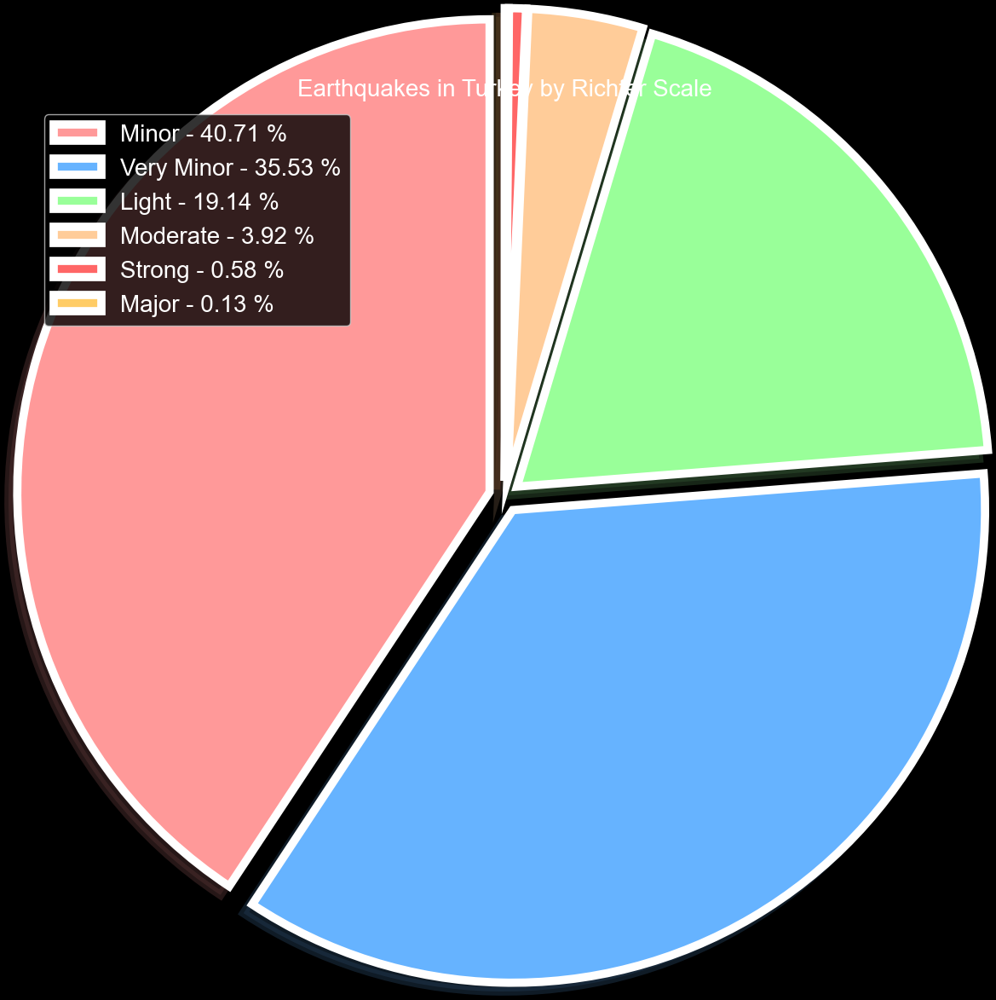

In [348]:
#Visualize value counts of Richter Scale in Turkey 
plt.figure(figsize=(12, 12))
colors = ['#ff9999','#66b3ff','#99ff99','#ffcc99','#ff6666','#ffcc66','#ff9999','#ff9999','#ff9999']
percent = eq['Richter Scale'].value_counts().values
labels = eq['Richter Scale'].value_counts().index
patches, texts = plt.pie(percent, colors=colors, startangle=90, radius=1.5, 
                            wedgeprops = { 'linewidth' : 7, 'edgecolor' : 'white' },
                            textprops = { 'fontsize' : 20 },
                            explode=[0.05]*len(labels),
                            shadow=True)
labels = ['{0} - {1:1.2f} %'.format(i,j) for i,j in zip(labels, (percent/percent.sum())*100)]
plt.title('Earthquakes in Turkey by Richter Scale', fontsize=20)
sort_legend = True
if sort_legend:
    patches, labels, dummy =  zip(*sorted(zip(patches, labels, percent),
                                          key=lambda x: x[2],
                                          reverse=True))

plt.legend(patches, labels, loc='upper left', bbox_to_anchor=(-0.1, 1.),
           fontsize=20)

plt.show()

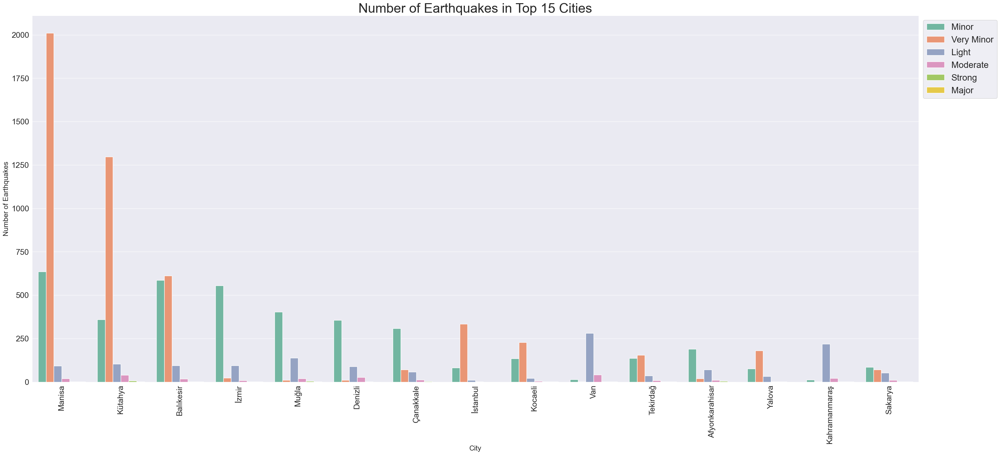

In [349]:
#Visualize the number of earthquakes in top 15 cities
sns.set_style("darkgrid")
plt.figure(figsize=(36, 15))
sns.countplot(x='city', data=eq, hue='Richter Scale', palette="Set2", order=eq['city'].value_counts().iloc[:15].index, 
              hue_order=eq['Richter Scale'].value_counts().index)
plt.xticks(rotation=90, fontsize=18)
plt.yticks(fontsize=18)
plt.title('Number of Earthquakes in Top 15 Cities', fontsize=30)
plt.xlabel('City', fontsize=16)
plt.ylabel('Number of Earthquakes', fontsize=16)
plt.legend(loc='upper left', bbox_to_anchor=(1, 1), ncol=1, fontsize=20)
plt.show()




In [350]:
#Manisa major earthquakes count

eq_manisa = eq[eq['city'] == 'Manisa']
eq_manisa['Richter Scale'].value_counts()


Very Minor    2011
Minor          635
Light           92
Moderate        19
Strong           2
Major            1
Name: Richter Scale, dtype: int64

In [351]:
print('The most earthquake prone city in Turkey is {} with {} earthquakes.'.format(eq['city'].value_counts().index[0], eq['city'].value_counts().values[0]))
    

The most earthquake prone city in Turkey is Manisa with 2760 earthquakes.


<center> Check the major earthquakes in Turkey </center>

In [352]:
print("Major earthquakes: ")
print(eq[eq['Richter Scale'] == 'Major'].get
      (['time', 'mag', 'province', 'Richter Scale']))

Major earthquakes: 
None


In [353]:
print(eq[eq['Richter Scale'] == 'Major']["city"])

11            Tekirdağ
18              Burdur
23               Sivas
38              Manisa
153          Gümüşhane
193               Ordu
198            Çankırı
201            Çankırı
235              İzmir
246            Karabük
256          Balıkesir
283              Muğla
284               None
286              Düzce
360            Sakarya
396            Kütahya
723                Van
12597          Kocaeli
12851            Düzce
18144              Van
19439        Gaziantep
19537    Kahramanmaraş
Name: city, dtype: object


In [354]:
#Extract the year from the time column
eq['time'] = pd.to_datetime(eq['time'])
eq['year'] = eq['time'].dt.year
    

In [355]:
print(eq[eq['Richter Scale'] == 'Major']["city"].value_counts())

Van              2
Çankırı          2
Düzce            2
Tekirdağ         1
Muğla            1
Gaziantep        1
Kocaeli          1
Kütahya          1
Sakarya          1
Balıkesir        1
Burdur           1
Karabük          1
İzmir            1
Ordu             1
Gümüşhane        1
Manisa           1
Sivas            1
Kahramanmaraş    1
Name: city, dtype: int64


<Figure size 2000x1000 with 0 Axes>

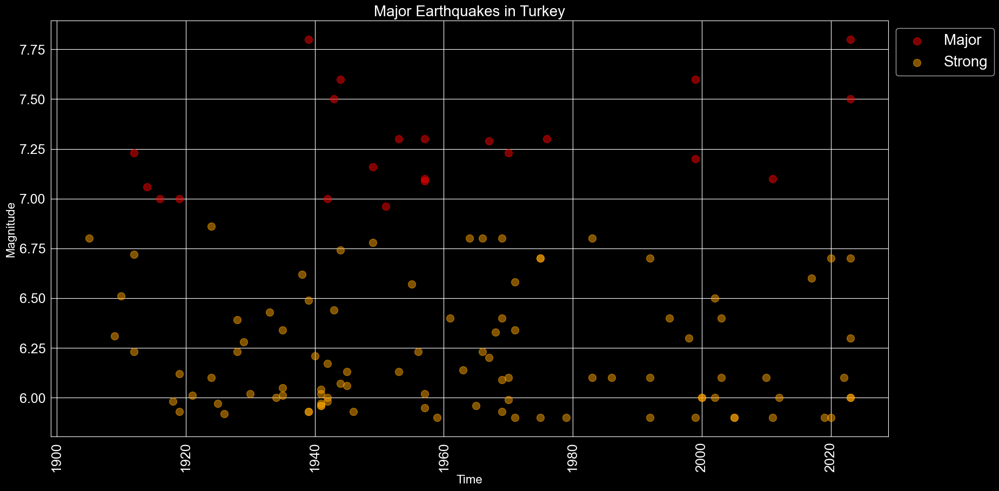

In [356]:
plt.style.use("dark_background")
plt.figure(figsize=(20, 10))


figure = eq[eq['Richter Scale'] == 'Major'].plot(kind='scatter', x='year', y='mag', color='red', s=100, alpha=0.5, label='Major'
                                                 , figsize=(20, 10)) 
eq[eq['Richter Scale'] == 'Strong'].plot(kind='scatter', x='year', y='mag', color='orange', s=100, alpha=0.5, label='Strong', ax=figure)
plt.title('Major Earthquakes in Turkey', fontsize=20)
plt.xlabel('Time', fontsize=16)
plt.ylabel('Magnitude', fontsize=16)
plt.xticks(fontsize=18, rotation=90)
plt.yticks(fontsize=18)
plt.legend(loc='upper left', bbox_to_anchor=(1, 1), ncol=1, fontsize=20)
plt.show();

<p> A KDE plot (Kernel Density Estimate plot) is a data visualization technique used to estimate the probability density function of a random variable.

Probability density is a concept in probability theory that is used to describe the likelihood of a continuous random variable taking on a particular value. In other words, it's a way of characterizing the probability distribution of a continuous random variable.
<p/>

Text(0, 0.5, 'Density')

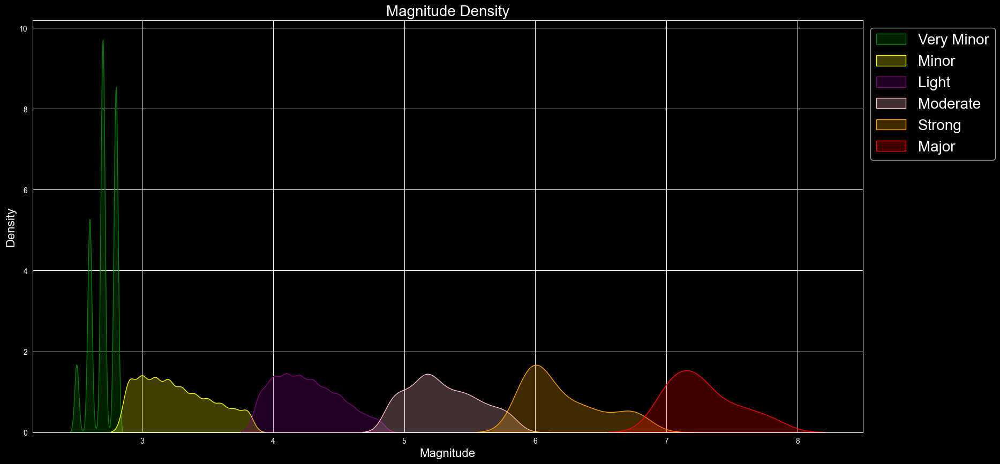

In [357]:
#Check for magnitude density
#kde plot is a kernel density estimate plot, which is a smooth version of a histogram
#kde plot for different Richter Scale
plt.figure(figsize=(20, 10))
sns.kdeplot(eq[eq['Richter Scale'] == 'Micro']['mag'], color='blue', label='Micro', fill=True)

sns.kdeplot(eq[eq['Richter Scale'] == 'Very Minor']['mag'], color='green', label='Very Minor', fill=True)

sns.kdeplot(eq[eq['Richter Scale'] == 'Minor']['mag'], color='yellow', label='Minor', fill=True)

sns.kdeplot(eq[eq['Richter Scale'] == 'Light']['mag'], color='purple', label='Light', fill=True)

sns.kdeplot(eq[eq['Richter Scale'] == 'Moderate']['mag'], color='pink', label='Moderate', fill=True)

sns.kdeplot(eq[eq['Richter Scale'] == 'Strong']['mag'], color='orange', label='Strong', fill=True)  

sns.kdeplot(eq[eq['Richter Scale'] == 'Major']['mag'],  color='red', label='Major', fill=True)
plt.legend(loc='upper left', bbox_to_anchor=(1, 1), ncol=1, fontsize=20)

plt.title('Magnitude Density', fontsize=20)
plt.xlabel('Magnitude', fontsize=16)
plt.ylabel('Density', fontsize=16)

#### Depth Scale

<p> The depth of an earthquake is the distance from the surface of the Earth to the focus, or the point where the earthquake originated. Earthquakes are classified as shallow, intermediate, or deep, depending on their depth. <b>Shallow</b> earthquakes are less than 70 km (43 mi) deep, <b>intermediate</b> earthquakes are between 70 and 300 km (43 and 186 mi) deep, and <b>deep</b> earthquakes are more than 300 km (186 mi) deep. </p>

In [358]:
def depth_scale(depth):
    if depth < 70:
        return 'Shallow'
    elif depth < 300:
        return 'Intermediate'
    else:
        return 'Deep'
    
eq['Depth Scale'] = eq['depth'].apply(depth_scale)


<center> Insert Second Dataframe to the First Dataframe </center>

In [359]:
eq.columns

Index(['time', 'latitude', 'longitude', 'depth', 'mag', 'magType', 'nst',
       'gap', 'dmin', 'rms', 'net', 'id', 'updated', 'place', 'type',
       'horizontalError', 'depthError', 'magError', 'magNst', 'status',
       'locationSource', 'magSource', 'country', 'location', 'loc', 'city',
       'town', 'Richter Scale', 'year', 'Depth Scale'],
      dtype='object')

In [360]:
df2.columns

Index(['Year', 'Mo', 'Dy', 'Hr', 'Mn', 'Sec', 'Tsu', 'Vol', 'Location Name',
       'Latitude', 'Longitude', 'Focal Depth (km)', 'Mag', 'MMI Int', 'Deaths',
       'Death Description', 'Missing', 'Missing Description', 'Injuries',
       'Injuries Description', 'Damage ($Mil)', 'Damage Description',
       'Houses Destroyed', 'Houses Destroyed Description', 'Houses Damaged',
       'Houses Damaged Description', 'Total Deaths', 'Total Death Description',
       'Total Missing', 'Total Missing Description', 'Total Injuries',
       'Total Injuries Description', 'Total Damage ($Mil)',
       'Total Damage Description', 'Total Houses Destroyed',
       'Total Houses Destroyed Description', 'Total Houses Damaged',
       'Total Houses Damaged Description'],
      dtype='object')

In [361]:
#See if eq's and df2's latitude and longitude match with the coordinates of the cities in the dataset. 

shared_lat_long = eq.merge(df2, left_on=['latitude', 'longitude'], right_on=['Latitude', 'Longitude'], how='inner')

shared_lat_long.shape

(82, 68)

In [362]:
#Df3 drop the total row at the end of the dataset
df3 = df3.drop(df3.index[-1])
df3

,Event,City,Code,Date (YMD),DataCards,Houses Damaged,With Houses Affected,fichas.latitude,fichas.longitude,Houses Heavy
0,Earthquake,Adana,1.0,1945/03/20,1,650.0,1.0,37.110001,34.700001,650.0
1,Earthquake,Adana,1.0,1952/10/22,1,918.0,1.0,37.250000,35.150002,511.0
2,Earthquake,Adana,1.0,1967/04/07,1,91.0,1.0,37.400002,36.200001,91.0
3,Earthquake,Adana,1.0,1998/06/27,1,82937.0,1.0,36.849998,35.549999,10675.0
4,Earthquake,Adıyaman,2.0,2004/02/26,1,NaN,NaN,37.862400,38.226101,NaN
...,...,...,...,...,...,...,...,...,...,...
235,Earthquake,Van,65.0,2011/11/09,1,NaN,NaN,38.438202,43.282501,NaN
236,Earthquake,Yalova,77.0,1963/09/18,1,230.0,1.0,40.770000,29.120001,230.0
237,Earthquake,Yozgat,66.0,1900/04/27,1,NaN,NaN,39.820000,34.810001,NaN
238,Earthquake,Yozgat,66.0,1926/12/29,1,NaN,NaN,40.000000,35.900002,NaN


In [363]:
#Change column 7 and 8 to latitude and longitude

df3 = df3.rename(columns={df3.columns[7]: "Latitude", df3.columns[8]: "Longitude"})
df3


,Event,City,Code,Date (YMD),DataCards,Houses Damaged,With Houses Affected,Latitude,Longitude,Houses Heavy
0,Earthquake,Adana,1.0,1945/03/20,1,650.0,1.0,37.110001,34.700001,650.0
1,Earthquake,Adana,1.0,1952/10/22,1,918.0,1.0,37.250000,35.150002,511.0
2,Earthquake,Adana,1.0,1967/04/07,1,91.0,1.0,37.400002,36.200001,91.0
3,Earthquake,Adana,1.0,1998/06/27,1,82937.0,1.0,36.849998,35.549999,10675.0
4,Earthquake,Adıyaman,2.0,2004/02/26,1,NaN,NaN,37.862400,38.226101,NaN
...,...,...,...,...,...,...,...,...,...,...
235,Earthquake,Van,65.0,2011/11/09,1,NaN,NaN,38.438202,43.282501,NaN
236,Earthquake,Yalova,77.0,1963/09/18,1,230.0,1.0,40.770000,29.120001,230.0
237,Earthquake,Yozgat,66.0,1900/04/27,1,NaN,NaN,39.820000,34.810001,NaN
238,Earthquake,Yozgat,66.0,1926/12/29,1,NaN,NaN,40.000000,35.900002,NaN


In [364]:
shared_lat_long["Date (YMD)"] = shared_lat_long["time"].dt.strftime("%Y/%m/%d")
shared_lat_long.head()

,time,latitude,longitude,depth,mag,magType,nst,gap,dmin,rms,...,Total Missing Description,Total Injuries,Total Injuries Description,Total Damage ($Mil),Total Damage Description,Total Houses Destroyed,Total Houses Destroyed Description,Total Houses Damaged,Total Houses Damaged Description,Date (YMD)
0,1909-02-09 11:24:05.020000+00:00,40.406,38.098,15.0,6.31,mw,30.579625,116.875321,0.867303,0.758262,...,NaN,NaN,NaN,NaN,3.0,NaN,3.0,NaN,NaN,1909/02/09
1,1912-08-09 01:29:02.060000+00:00,40.730,27.121,15.0,7.23,mw,30.579625,116.875321,0.867303,0.758262,...,NaN,7000.0,4.0,NaN,4.0,24700.0,4.0,15400.0,4.0,1912/08/09
2,1916-01-24 06:55:13.580000+00:00,40.201,37.312,15.0,7.00,mw,30.579625,116.875321,0.867303,0.758262,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1916/01/24
3,1935-01-04 14:41:30.810000+00:00,40.620,27.451,15.0,6.34,mw,30.579625,116.875321,0.867303,0.758262,...,NaN,30.0,1.0,NaN,3.0,NaN,4.0,NaN,NaN,1935/01/04
4,1935-05-01 10:24:44.470000+00:00,40.566,43.415,10.0,6.05,mw,30.579625,116.875321,0.867303,0.758262,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1935/05/01


In [365]:
#Merge the two datasets by "Date YMD" 
df4 = pd.merge(df3, shared_lat_long,  left_on='Date (YMD)', right_on='Date (YMD)', how='inner')

#sort the values by date
df4 = df4.sort_values(by=['Date (YMD)'])

df4

,Event,City,Code,Date (YMD),DataCards,Houses Damaged,With Houses Affected,Latitude_x,Longitude_x,Houses Heavy,...,Total Missing,Total Missing Description,Total Injuries,Total Injuries Description,Total Damage ($Mil),Total Damage Description,Total Houses Destroyed,Total Houses Destroyed Description,Total Houses Damaged,Total Houses Damaged Description
54,Earthquake,Sivas,58.0,1909/02/09,1,5000.0,1.0,40.169998,37.759998,5000.0,...,NaN,NaN,NaN,NaN,NaN,3.0,NaN,3.0,NaN,NaN
55,Earthquake,Tekirdağ,59.0,1912/08/09,1,5540.0,1.0,40.599998,27.200001,5540.0,...,NaN,NaN,7000.0,4.0,NaN,4.0,24700.0,4.0,15400.0,4.0
56,Earthquake,Tokat,60.0,1916/01/24,1,5000.0,1.0,40.270000,36.830002,5000.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,Earthquake,Balıkesir,10.0,1935/01/04,1,600.0,1.0,40.400002,27.490000,600.0,...,NaN,NaN,30.0,1.0,NaN,3.0,NaN,4.0,NaN,NaN
38,Earthquake,Kars,36.0,1935/05/01,1,1300.0,1.0,40.090000,43.220001,1300.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7,Earthquake,Ankara,6.0,2007/12/26,1,3336.0,1.0,39.396000,33.107300,1170.0,...,NaN,NaN,NaN,NaN,NaN,3.0,2214.0,4.0,NaN,NaN
15,Earthquake,Bingöl,12.0,2010/03/08,1,1173.0,1.0,38.775200,40.029499,269.0,...,NaN,NaN,100.0,2.0,NaN,2.0,287.0,3.0,700.0,3.0
16,Earthquake,Elazığ,23.0,2010/03/08,1,10445.0,1.0,38.775200,40.029499,3563.0,...,NaN,NaN,100.0,2.0,NaN,2.0,287.0,3.0,700.0,3.0
42,Earthquake,Kütahya,43.0,2011/05/19,1,NaN,NaN,39.132801,29.082001,NaN,...,NaN,NaN,125.0,3.0,NaN,1.0,NaN,NaN,NaN,2.0


In [366]:
#Check if "city" column is the same in both datasets

df4_city = df4[df4['city'] == df4['City']]
df4_city.shape


(43, 78)

In [367]:
#drop columns who has more than 50% of the values missing
df4 = df4_city.dropna(thresh=len(df4)*0.5, axis=1)
df4.shape

(43, 57)

In [368]:
df4.columns

Index(['Event', 'City', 'Code', 'Date (YMD)', ' DataCards', ' Houses Damaged',
       ' With Houses Affected', 'Latitude_x', 'Longitude_x', ' Houses Heavy',
       'time', 'latitude', 'longitude', 'depth', 'mag', 'magType', 'nst',
       'gap', 'dmin', 'rms', 'net', 'id', 'updated', 'place', 'type',
       'horizontalError', 'depthError', 'magError', 'magNst', 'status',
       'locationSource', 'magSource', 'country', 'location', 'loc', 'city',
       'town', 'Richter Scale', 'year', 'Depth Scale', 'Year', 'Mo', 'Dy',
       'Hr', 'Mn', 'Sec', 'Location Name', 'Latitude_y', 'Longitude_y',
       'Focal Depth (km)', 'Mag', 'Deaths', 'Death Description',
       'Damage Description', 'Total Deaths', 'Total Death Description',
       'Total Damage Description'],
      dtype='object')

In [369]:
import warnings

cat_cols = df4.select_dtypes(include=['object']).columns

num_cols = df4.select_dtypes(exclude=['object']).columns

    
warnings.filterwarnings('ignore')
#Fill the missing numerical values with the mean of the column
for col in num_cols:
    df4[col].fillna(df4[col].mean(), inplace=True)
    

#Fill the missing categorical values with the "Unknown" value
for col in cat_cols:
    df4[col].fillna('Unknown', inplace=True)


In [370]:
#drop duplicate row
df4 = df4.drop_duplicates()
df4.shape



(43, 57)

-----------------------------------------------------------------------------------------------------------------------------------

In [371]:
import plotly.express as px

place_group = df4.groupby(['city', 'Richter Scale']).size().reset_index(name='count')
fig = px.treemap(place_group, path=['city', 'Richter Scale'], values='count', color='count', color_continuous_scale='RdBu')

fig.show()

#Save it as png
fig.write_image("output_images/fig1.png")

In [372]:
place_depth = df4.groupby(['city', 'Depth Scale']).size().reset_index(name='count')
fig = px.treemap(place_depth, path=['city', 'Depth Scale'], values='count', color='count', color_continuous_scale='RdBu')

fig.show()

#Save it as png
fig.write_image("output_images/fig2.png")

### Spatial Analysis

In [373]:
shared_lat_long.describe()

,latitude,longitude,depth,mag,nst,gap,dmin,rms,horizontalError,depthError,...,Total Missing,Total Missing Description,Total Injuries,Total Injuries Description,Total Damage ($Mil),Total Damage Description,Total Houses Destroyed,Total Houses Destroyed Description,Total Houses Damaged,Total Houses Damaged Description
count,82.000000,82.000000,82.000000,82.000000,82.000000,82.000000,8.200000e+01,82.000000,82.000000,82.000000,...,0.0,0.0,50.000000,54.000000,12.000000,71.000000,22.000000,30.000000,15.000000,25.000000
mean,39.198671,35.464915,15.578049,5.903171,159.719284,91.560277,8.673025e-01,0.920064,4.311959,5.356547,...,NaN,NaN,2599.020000,2.074074,220.247500,2.140845,16635.772727,2.866667,2919.533333,2.680000
std,1.282971,5.888113,10.615596,0.930047,182.652581,38.386056,2.234110e-16,0.195355,0.000000,2.374213,...,NaN,NaN,14129.185083,1.179252,347.698172,1.099296,32314.706036,1.252125,4305.544247,1.029563
min,36.405000,26.587000,3.100000,2.900000,29.000000,15.100000,8.673025e-01,0.758262,4.311959,3.000000,...,NaN,NaN,1.000000,1.000000,3.000000,1.000000,1.000000,1.000000,25.000000,1.000000
25%,38.178250,29.576250,10.000000,5.400000,30.579625,57.475000,8.673025e-01,0.758262,4.311959,4.900000,...,NaN,NaN,15.000000,1.000000,5.000000,1.000000,83.000000,2.000000,181.500000,2.000000
50%,39.473000,36.032500,10.000000,5.900000,30.579625,116.875321,8.673025e-01,0.758262,4.311959,5.298684,...,NaN,NaN,63.000000,2.000000,22.500000,2.000000,1957.000000,3.000000,622.000000,3.000000
75%,40.320500,40.956000,20.000000,6.485000,332.250000,116.875321,8.673025e-01,1.100000,4.311959,5.298684,...,NaN,NaN,340.500000,3.000000,291.850000,3.000000,7546.750000,4.000000,4800.000000,4.000000
max,40.907000,43.979000,60.200000,7.800000,578.000000,116.875321,8.673025e-01,1.310000,4.311959,25.000000,...,NaN,NaN,100000.000000,4.000000,1000.000000,4.000000,120000.000000,4.000000,15400.000000,4.000000


In [374]:
import folium


cat_cols = shared_lat_long.select_dtypes(include=['object']).columns
num_cols = shared_lat_long.select_dtypes(exclude=['object']).columns

for col in cat_cols:
    shared_lat_long[col].fillna('Unknown', inplace=True)
    
for col in num_cols:
    shared_lat_long[col].fillna(0, inplace=True)
    


#Create a map of Turkey
m = folium.Map(location=shared_lat_long[['Latitude', 'Longitude']].mean().values.tolist(), zoom_start=6, min_zoom=5,
               max_zoom=7, tiles='cartodbpositron')
#add the fault lines
#gdf= gpd.read_file('geojson/gem_active_faults_harmonized.geojson')

#Add style to geojson
style = {'fillColor': '#00000F', 'color': '#00000F', 'weight': 1.5, 'dashArray': '5, 5'}

#Add fault lines
#folium.GeoJson(gdf, style_function=lambda x: style).add_to(m)



#folium.GeoJson(geojson, name='geojson').add_to(m)
folium.LatLngPopup().add_to(m) #custom popup of lat and long

for i in range(0, len(shared_lat_long)):
    folium.Circle(
        location=[shared_lat_long.iloc[i]['Latitude'], shared_lat_long.iloc[i]['Longitude']],
       tooltip = '<li><bold>Year: ' + str(shared_lat_long.iloc[i]['Year']) + '</bold></li>' +
                  '<li><bold>Location Name: ' + str(shared_lat_long.iloc[i]['Location Name']) + '</bold></li>' +
                  '<li><bold>Focal Depth: ' + str(shared_lat_long.iloc[i]['Focal Depth (km)']) + '</bold></li>' +
                  '<li><bold>Intensity: ' + str(shared_lat_long.iloc[i]['MMI Int']) + '</bold></li>' +
                    '<li><bold>Deaths: ' + str(shared_lat_long.iloc[i]['Total Deaths']) + '</bold></li>' +
                    '<li><bold>Total Injuries: ' + str(shared_lat_long.iloc[i]['Total Injuries']) + '</bold></li>' +
                    '<li><bold>Total Damage ($Mil): ' + str(shared_lat_long.iloc[i]['Total Damage ($Mil)']) + '</bold></li>' +
                    '<li><bold>Total Houses Destroyed: ' + str(shared_lat_long.iloc[i]['Total Houses Destroyed']) + '</bold></li>' +
                    '<li><bold>Total Houses Damaged: ' + str(shared_lat_long.iloc[i]['Total Houses Damaged']) + '</bold></li>',
        radius=int(shared_lat_long.iloc[i]['Total Damage ($Mil)'])*100,
        color='crimson',
        fill=True,
        fill_color='crimson',
        popup=shared_lat_long.iloc[i]['Location Name'],
    ).add_to(m)
            
            
m


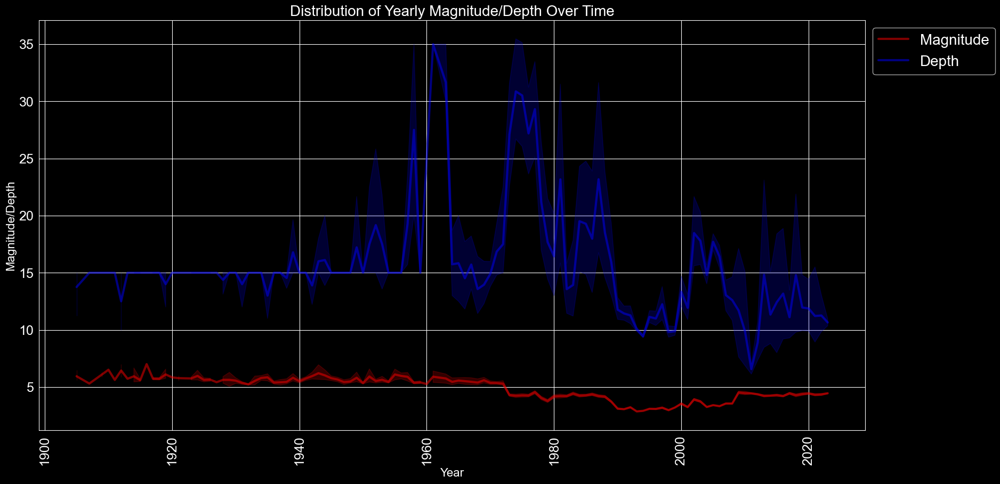

In [375]:
#Distribution of Yearly Magnitude/Depth Over Time
plt.figure(figsize=(20, 10))
sns.lineplot(x='year', y='mag', data=eq, color='red', label='Magnitude', alpha=0.5, linewidth=3)
sns.lineplot(x='year', y='depth', data=eq, color='blue', label='Depth', alpha=0.5, linewidth=3)
plt.title('Distribution of Yearly Magnitude/Depth Over Time', fontsize=20)
plt.xlabel('Year', fontsize=16)
plt.ylabel('Magnitude/Depth', fontsize=16)
plt.xticks(fontsize=18, rotation=90)
plt.yticks(fontsize=18)
plt.legend(loc='upper left', bbox_to_anchor=(1, 1), ncol=1, fontsize=20)
plt.show()

<small>

The shade around the line represents the confidence interval (CI) of the mean of the data at each x value. The default CI is 95%, which means that the shaded area represents the range within which we are 95% confident that the true mean of the data lies, based on the sample that we have.

The width of the shaded area reflects the level of uncertainty in the estimate of the mean at each x value. If the shaded area is narrow, it indicates that there is low variability in the data and we are relatively certain about the estimated mean. On the other hand, if the shaded area is wide, it suggests that there is high variability in the data, and we are less certain about the estimated mean.

</small>

-----------------------------------------------------------------------------------------------------------------------------------

<small>

_Observed Feature_ refers to any feature or characteristic of the raw time series data, such as the mean, variance, or any other statistical properties.

_Trend Feature_ refers to any feature or characteristic of the long-term changes or patterns in the time series, such as the slope, intercept, or curvature of the trend line.

_Seasonal Feature_ refers to any feature or characteristic of the cyclical patterns or seasonal variations in the time series, such as the amplitude, period, or phase of the seasonal component.

_Residual Feature_ refers to any feature or characteristic of the random or unpredictable fluctuations in the time series that cannot be explained by the trend or seasonal components, such as the autocorrelation, variance, or randomness of the residual component.
<small/>

In [376]:
#Plot observed depth/magnitude over time
#Plot trend of observed magnitude/depth over time
#Plot seasonality of observed magnitude/depth over time
lbl = ['Depth', 'Magnitude']    
fig = make_subplots(rows=4, cols=2, subplot_titles=('Observed Depth', 'Observed Magnitude', 'Trend Depth',
                                                    'Trend Magnitude','Seasonal Depth','Seasonal Magnitude',
                                                    'Residual Depth','Residual Magnitude'))

for idx,column in enumerate(['depth','mag']):
    res = seasonal_decompose(eq[column], period=100, model='additive', extrapolate_trend='freq')

    res = seasonal_decompose(eq[column], period=100, model='additive', extrapolate_trend='freq')
    
    fig.add_trace(
    go.Scatter(x=np.arange(0,len(res.observed)), y=res.observed,name='{} Observed'.format(lbl[idx])),
    row=1, col=idx+1)
    
    fig.add_trace(
    go.Scatter(x=np.arange(0,len(res.trend)), y=res.trend,name='{} Trend'.format(lbl[idx])),
    row=2, col=idx+1)

    fig.add_trace(
    go.Scatter(x=np.arange(0,len(res.seasonal)), y=res.seasonal,name='{} Seasonal'.format(lbl[idx])),
    row=3, col=idx+1)

    fig.add_trace(
    go.Scatter(x=np.arange(0,len(res.resid)), y=res.resid,name='{} Residual'.format(lbl[idx])),
    row=4, col=idx+1)



fig.update_layout(height=1500, width=2000, title_text="Seasonal Decomposition of Depth/Magnitude")
fig.show()
    

<small>Autocorrelation, also known as serial correlation, is a statistical concept that describes the correlation between a variable and a lagged version of itself over time. In other words, it measures how closely related a time series is to a delayed version of itself.

Autocorrelation is often used in time series analysis to identify patterns and relationships in data that change over time. A positive autocorrelation indicates that the value of a variable at a particular time is strongly related to its value at a previous time, while a negative autocorrelation indicates that the variable is negatively related to its past values.
<small/>

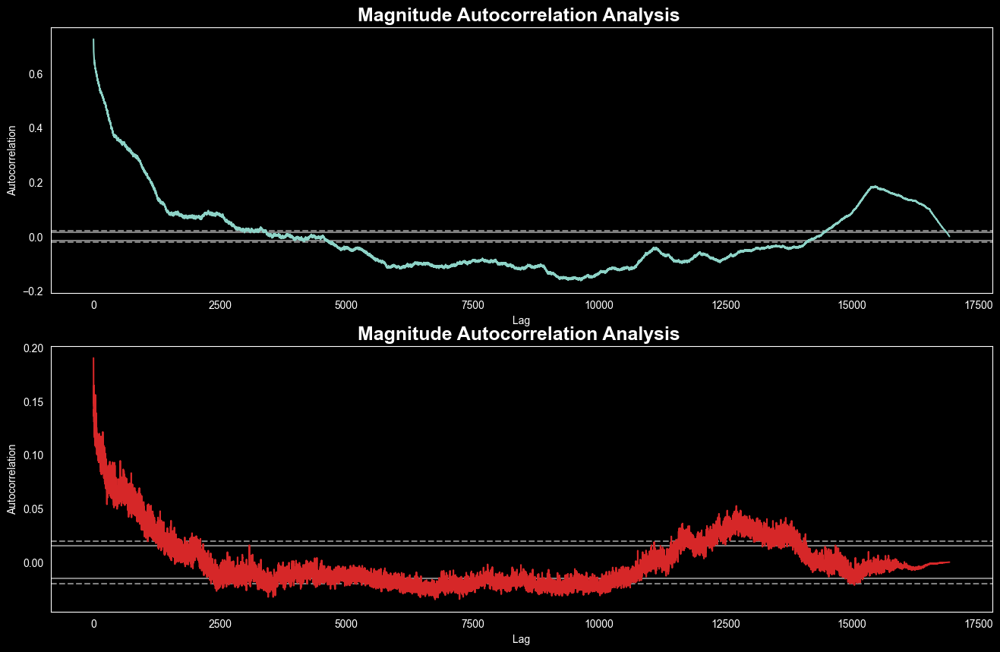

In [377]:


f, ax = plt.subplots(nrows=2, ncols=1, figsize=(16, 10))

ax[0].set_title('Magnitude Autocorrelation Analysis ',fontsize=18,fontweight='bold')
autocorrelation_plot(eq['mag'],ax=ax[0])
ax[1].set_title('Magnitude Autocorrelation Analysis ',fontsize=18,fontweight='bold')
autocorrelation_plot(eq['depth'],ax=ax[1],color='tab:red')
plt.show()

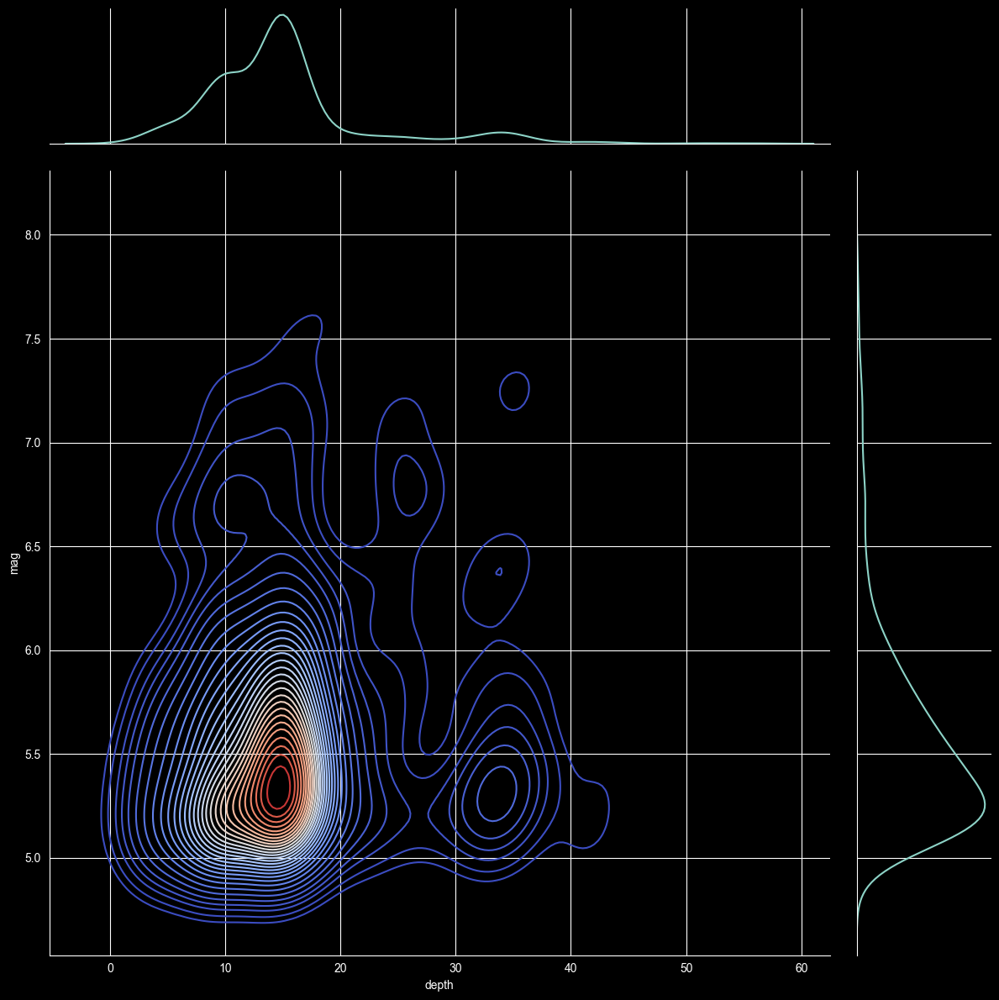

In [378]:
eq_temp = eq.copy()
eq_temp = eq_temp[eq_temp['mag'] > 5.0]
eq_temp = eq_temp[eq_temp['depth'] < 60.0]

#height is the size of the plot
#levels is the number of contours

sns.jointplot(data=eq_temp,x='depth',y='mag',kind='kde',cmap='coolwarm',height=12,levels=30);

In [379]:
plt.style.use('dark_background')

eq["time"] = pd.to_datetime(eq["time"], format="%Y-%m-%d %H:%M:%S")
eq["year"] = eq["time"].dt.year
#Take between 1980 and 2020
eq_1980 = eq[eq['year'] >= 1980]
#magnitude vs depth by year
df_year = eq_1980[['year', 'mag', 'depth']]
df_year = df_year.groupby(['year']).mean()
df_year = df_year.reset_index()
fig = px.scatter(df_year, x='year', y='depth', color='mag', size='mag', hover_name='year')
fig.update_layout(title='World Magnitude vs Depth by Year')
#Draw lines for 1983, 1992, 1995, 1998, 1999, 2002, 2003, 2011, 2014, 2017, 2020, 2023
years = [1983, 1992, 1995, 1998, 1999, 2002, 2003, 2011, 2014, 2017, 2020, 2023]
for year in years:
    fig.add_vline(x=year, line_width=3, line_dash="dash", line_color="red")
#Increase size of title
fig.update_layout(title=dict(x=0.5, xanchor='center', font=dict(size=25)))

#Increase size of xticks and yticks
fig.update_xaxes(tickfont=dict(size=18))
fig.update_yaxes(tickfont=dict(size=18))
fig.show()

#Probably because of the aftershocks. They lower mean depth and magnitude of the year.

#Save as png
fig.write_image("output_images/World_Magnitude_vs_Depth_by_Year.png", width=2000, height=800)


<u>6.1+ Earthquakes by Year</u>
<small>
* 1983 Erzurum earthquake

* 1992 Erzincan earthquake

* 1995 Dinar earthquake

* 1998 Adana–Ceyhan earthquake

* 1999 İzmit earthquake

* 1999 Düzce Earthquake

* 2002 Afyon earthquake

* 2003 Bingöl earthquake

* 2011 Van Earthquake

* 2014 Aegean Sea earthquake

* 2017 Aegean Sea earthquake

* 2020 İzmir Earthquake

* 2020 Elazığ Earthquake

* 2023 Kahramanmaraş Earthquake

* 2023 Turkey–Syria earthquakes

<small/>

<center> Earthquakes Activity Animation in Turkey </center>

In [380]:
fig = px.density_mapbox(eq, lat='latitude', lon='longitude', z='mag', radius=15, zoom=4, center=dict(lat=39.42, lon=35),
                        mapbox_style="stamen-terrain", title='Earthquakes in Turkey', labels={'mag':'Magnitude'}, 
                        animation_frame='year', width=1000, height=800)
fig.update_layout(title_text='Earthquakes in Turkey', title_x=0.5, title_font=dict(size=30))

fig.show()

Clustering

In [381]:
from sklearn.cluster import KMeans


#KMeans Clustering

kmeans = KMeans(n_clusters=4, random_state=0).fit(eq[['mag','depth']])
eq['cluster'] = kmeans.labels_

#3D Plot of Clusters
fig = px.scatter_3d(eq, x='mag', y='depth', z='year', color='cluster', opacity=0.5, width=1000, height=800)
fig.update_layout(title_text='3D Plot of Clusters', title_x=0.5, title_font=dict(size=30))
fig.show()


    



<small>

- Cluster 0: 1939-2023 depth: 20-40 mag: 3-5 

- Cluster 1: 1906-2023 depth: 0-20 mag: 3-7

- Cluster 2: 1971-2023 depth: 60-80 mag: 3-6

- Cluster 3: 1975-2023 depth: 80-160 mag: 3-6

 </small>

<center> Group by city </center>

In [382]:
#Find most earthquake prone areas

#Save every city as a separate dataframe

cities = eq['city'].unique()
city_dfs = []
for city in cities:
    city_dfs.append(eq[eq['city'] == city])


    
city_dfs[0].head()

,time,latitude,longitude,depth,mag,magType,nst,gap,dmin,rms,...,magSource,country,location,loc,city,town,Richter Scale,year,Depth Scale,cluster
0,1905-05-20 11:06:10.250000+00:00,40.162,39.397,15.0,5.62,mw,30.579625,116.875321,0.867303,0.758262,...,iscgem,Turkey,"(40.162, 39.397)","Özyurt, Kelkit, Gümüşhane, Karadeniz Bölgesi, ...",Gümüşhane,Kelkit,Moderate,1905,Shallow,1
89,1930-04-09 05:27:56.270000+00:00,40.403,39.194,15.0,5.37,mw,30.579625,116.875321,0.867303,0.758262,...,iscgemsup,Turkey,"(40.403, 39.194)","Köklü, Torul, Gümüşhane, Karadeniz Bölgesi, Tü...",Gümüşhane,Torul,Moderate,1930,Shallow,1
93,1930-12-10 10:31:30.010000+00:00,39.972,39.152,15.0,5.81,mw,30.579625,116.875321,0.867303,0.758262,...,iscgem,Turkey,"(39.972, 39.152)","Kelkit, Gümüşhane, Karadeniz Bölgesi, Türkiye",Gümüşhane,Kelkit,Moderate,1930,Shallow,1
153,1939-12-26 23:57:23.820000+00:00,39.907,39.586,20.0,7.80,mw,30.579625,116.875321,0.867303,0.758262,...,iscgem,Turkey,"(39.907, 39.586)","Ağlık, Gümüşhane, Karadeniz Bölgesi, Türkiye",Gümüşhane,Ağlı,Major,1939,Shallow,0
156,1939-12-29 11:33:39.610000+00:00,40.028,39.194,15.0,5.58,mw,30.579625,116.875321,0.867303,0.758262,...,iscgem,Turkey,"(40.028, 39.194)","Kelkit, Gümüşhane, Karadeniz Bölgesi, Türkiye",Gümüşhane,Kelkit,Moderate,1939,Shallow,1


In [383]:
#Select the cities with more than 100 earthquakes

city_dfs = [city for city in city_dfs if len(city) > 250]
len(city_dfs)

14

In [384]:
#save each city dataframe as a csv file
for city in city_dfs:
    city.to_csv('cities/{}.csv'.format(city['city'].iloc[0]), index=False)

<center>Towns with the most earthquakes </center>

In [385]:
just_counties = towns_coords[towns_coords['capital'] == 'minor']
just_counties = just_counties[['city','lat','lng', 'population']]

#Rename columns
just_counties.columns = ['town','latitude','longitude', 'population']

In [386]:
towns

,İL ADI,İLÇE,2021,2022
0,ADANA,Aladağ,15855,15897
1,ADANA,Ceyhan,159955,158922
2,ADANA,Çukurova,389319,389175
3,ADANA,Feke,16072,15833
4,ADANA,İmamoğlu,27399,27037
...,...,...,...,...
968,DÜZCE,Çilimli,19848,19648
969,DÜZCE,Gölyaka,20506,20552
970,DÜZCE,Gümüşova,16347,16844
971,DÜZCE,Kaynaşlı,20540,20449


In [387]:
towns.columns

Index(['İL ADI', 'İLÇE', 2021, 2022], dtype='object')

In [388]:
#Rename columns
towns.columns = ['city', 'town', 'one', 'two']
towns["avg"] = (towns["one"] + towns["two"])/2
towns = towns[['city', 'town', 'avg']]
towns

,city,town,avg
0,ADANA,Aladağ,15876.0
1,ADANA,Ceyhan,159438.5
2,ADANA,Çukurova,389247.0
3,ADANA,Feke,15952.5
4,ADANA,İmamoğlu,27218.0
...,...,...,...
968,DÜZCE,Çilimli,19748.0
969,DÜZCE,Gölyaka,20529.0
970,DÜZCE,Gümüşova,16595.5
971,DÜZCE,Kaynaşlı,20494.5


In [389]:
just_counties   

,town,latitude,longitude,population
26,Tarsus,36.9167,34.9000,339676.0
28,Alanya,36.5436,31.9997,312319.0
31,İskenderun,36.5804,36.1700,297943.0
34,İnegöl,40.0806,29.5097,268155.0
37,Çorlu,41.1597,27.8028,262862.0
...,...,...,...,...
1600,Pülümür,39.4845,39.8953,NaN
1601,Kırmızıköprü,39.3872,39.8061,NaN
1602,Dağyolu,39.5402,39.9070,NaN
1603,İbradı,37.0969,31.5992,NaN


In [390]:
#Merge the two dataframes by town name
towns = pd.merge(just_counties, towns, on='town')
towns.drop(["population"], axis=1, inplace=True)
towns

,town,latitude,longitude,city,avg
0,Tarsus,36.9167,34.9000,MERSİN,349023.0
1,Alanya,36.5436,31.9997,ANTALYA,357408.0
2,İskenderun,36.5804,36.1700,HATAY,251329.0
3,İnegöl,40.0806,29.5097,BURSA,290666.5
4,Çorlu,41.1597,27.8028,TEKİRDAĞ,287531.0
...,...,...,...,...,...
963,Kemah,39.5961,39.0233,ERZİNCAN,7368.5
964,Hafik,39.8564,37.3864,SİVAS,9362.0
965,Pülümür,39.4845,39.8953,TUNCELİ,3390.0
966,İbradı,37.0969,31.5992,ANTALYA,2871.5


<center>Which earthquakes were the most destructive?        </center>

In [391]:
#Use df4 to see the damage of the earthquakes in the cities
df4.head()

,Event,City,Code,Date (YMD),DataCards,Houses Damaged,With Houses Affected,Latitude_x,Longitude_x,Houses Heavy,...,Latitude_y,Longitude_y,Focal Depth (km),Mag,Deaths,Death Description,Damage Description,Total Deaths,Total Death Description,Total Damage Description
54,Earthquake,Sivas,58.0,1909/02/09,1,5000.0,1.0,40.169998,37.759998,5000.0,...,40.406,38.098,14.268293,6.3,437.096774,2.0,3.000000,437.096774,2.0,3.00000
55,Earthquake,Tekirdağ,59.0,1912/08/09,1,5540.0,1.0,40.599998,27.200001,5540.0,...,40.730,27.121,15.000000,7.2,2800.000000,4.0,4.000000,2800.000000,4.0,4.00000
8,Earthquake,Balıkesir,10.0,1935/01/04,1,600.0,1.0,40.400002,27.490000,600.0,...,40.620,27.451,7.000000,6.4,5.000000,1.0,3.000000,5.000000,1.0,3.00000
38,Earthquake,Kars,36.0,1935/05/01,1,1300.0,1.0,40.090000,43.220001,1300.0,...,40.566,43.415,10.000000,6.1,540.000000,3.0,2.263158,540.000000,3.0,2.27027
39,Earthquake,Kırşehir,40.0,1938/04/19,1,3860.0,1.0,39.439999,33.790001,3860.0,...,39.544,33.911,10.000000,6.6,224.000000,3.0,3.000000,224.000000,3.0,3.00000


In [392]:
df4.columns

Index(['Event', 'City', 'Code', 'Date (YMD)', ' DataCards', ' Houses Damaged',
       ' With Houses Affected', 'Latitude_x', 'Longitude_x', ' Houses Heavy',
       'time', 'latitude', 'longitude', 'depth', 'mag', 'magType', 'nst',
       'gap', 'dmin', 'rms', 'net', 'id', 'updated', 'place', 'type',
       'horizontalError', 'depthError', 'magError', 'magNst', 'status',
       'locationSource', 'magSource', 'country', 'location', 'loc', 'city',
       'town', 'Richter Scale', 'year', 'Depth Scale', 'Year', 'Mo', 'Dy',
       'Hr', 'Mn', 'Sec', 'Location Name', 'Latitude_y', 'Longitude_y',
       'Focal Depth (km)', 'Mag', 'Deaths', 'Death Description',
       'Damage Description', 'Total Deaths', 'Total Death Description',
       'Total Damage Description'],
      dtype='object')

In [393]:
from math import log
#Create a new variable for the damage
df4['damage'] = df4[" Houses Damaged"] * df4["Total Deaths"]
#Take the log of the damage
df4['damage'] = df4['damage'].apply(lambda x: log(x))
    
df4.head()

,Event,City,Code,Date (YMD),DataCards,Houses Damaged,With Houses Affected,Latitude_x,Longitude_x,Houses Heavy,...,Longitude_y,Focal Depth (km),Mag,Deaths,Death Description,Damage Description,Total Deaths,Total Death Description,Total Damage Description,damage
54,Earthquake,Sivas,58.0,1909/02/09,1,5000.0,1.0,40.169998,37.759998,5000.0,...,38.098,14.268293,6.3,437.096774,2.0,3.000000,437.096774,2.0,3.00000,14.597348
55,Earthquake,Tekirdağ,59.0,1912/08/09,1,5540.0,1.0,40.599998,27.200001,5540.0,...,27.121,15.000000,7.2,2800.000000,4.0,4.000000,2800.000000,4.0,4.00000,16.557124
8,Earthquake,Balıkesir,10.0,1935/01/04,1,600.0,1.0,40.400002,27.490000,600.0,...,27.451,7.000000,6.4,5.000000,1.0,3.000000,5.000000,1.0,3.00000,8.006368
38,Earthquake,Kars,36.0,1935/05/01,1,1300.0,1.0,40.090000,43.220001,1300.0,...,43.415,10.000000,6.1,540.000000,3.0,2.263158,540.000000,3.0,2.27027,13.461689
39,Earthquake,Kırşehir,40.0,1938/04/19,1,3860.0,1.0,39.439999,33.790001,3860.0,...,33.911,10.000000,6.6,224.000000,3.0,3.000000,224.000000,3.0,3.00000,13.670069


In [394]:
#sort the dataframe by damage
df4 = df4.sort_values(by='damage', ascending=False)

#Take the top 20 cities
df4 = df4.head(20)
df4

,Event,City,Code,Date (YMD),DataCards,Houses Damaged,With Houses Affected,Latitude_x,Longitude_x,Houses Heavy,...,Longitude_y,Focal Depth (km),Mag,Deaths,Death Description,Damage Description,Total Deaths,Total Death Description,Total Damage Description,damage
25,Earthquake,Düzce,81.0,1999/11/12,1,133496.00000,1.0,40.790000,31.210000,30389.00000,...,31.161,10.000000,7.2,894.000000,3.0000,4.000000,894.000000,3.0000,4.00000,18.597533
50,Earthquake,Muş,49.0,1966/08/19,1,36927.00000,1.0,39.169998,41.560001,20007.00000,...,41.572,24.000000,6.8,2394.000000,4.0000,3.000000,2394.000000,4.0000,3.00000,18.297419
24,Earthquake,Diyarbakır,21.0,1975/09/06,1,19982.00000,1.0,38.470001,40.720001,8149.00000,...,40.723,26.000000,6.7,2311.000000,4.0000,3.000000,2311.000000,4.0000,2.27027,17.648023
41,Earthquake,Kütahya,43.0,1970/03/28,1,27029.00000,1.0,39.209999,29.510000,9452.00000,...,29.570,25.000000,7.2,1086.000000,4.0000,4.000000,1086.000000,4.0000,4.00000,17.194922
28,Earthquake,Erzincan,24.0,1992/03/13,1,31194.00000,1.0,39.630001,39.509998,6702.00000,...,39.605,27.000000,6.9,653.000000,3.0000,4.000000,653.000000,3.0000,4.00000,16.829558
55,Earthquake,Tekirdağ,59.0,1912/08/09,1,5540.00000,1.0,40.599998,27.200001,5540.00000,...,27.121,15.000000,7.2,2800.000000,4.0000,4.000000,2800.000000,4.0000,4.00000,16.557124
1,Earthquake,Adana,1.0,1998/06/27,1,82937.00000,1.0,36.849998,35.549999,10675.00000,...,35.307,33.000000,6.3,145.000000,3.0000,4.000000,145.000000,3.0000,4.00000,16.302570
14,Earthquake,Bingöl,12.0,2005/03/14,1,15292.65625,1.0,39.418598,40.818298,4427.28125,...,40.890,5.000000,5.8,437.096774,2.1875,3.000000,437.096774,2.1875,3.00000,15.715283
13,Earthquake,Bingöl,12.0,2005/03/12,1,15292.65625,1.0,39.416500,40.867199,4427.28125,...,40.978,11.000000,5.6,437.096774,2.1875,2.000000,437.096774,2.1875,2.00000,15.715283
47,Earthquake,Muğla,48.0,2004/08/04,2,15292.65625,1.0,73.841801,55.355200,4427.28125,...,27.815,10.000000,5.6,437.096774,2.1875,2.263158,437.096774,2.1875,2.27027,15.715283


In [395]:
#Drop duplicates
df4 = df4.drop_duplicates(subset=['city'])

In [396]:
#Plot these cities with their magnitude and depth and damage

fig = px.scatter(df4, x='Mag', y='Focal Depth (km)', color='damage', size='damage', hover_name='City', text='City' ,width=2000, height=1200)
fig.update_layout(title='Cities with the most damage', title_x=0.5, title_font=dict(size=30))
fig.update_traces(textposition='top center')
fig.update_xaxes(tickfont=dict(size=18))
fig.update_yaxes(tickfont=dict(size=18))
fig.update_layout(font=dict(size=35))
            



fig.show()

#save as png
fig.write_image("output_images/Cities_with_the_most_damage.png", width=2500, height=1400)


---------------------------------------------------------------------------------------------------------------------------------

In [397]:
#Create a new dataframe indexed by town
eq_towns = eq.set_index('town')
eq_towns


,time,latitude,longitude,depth,mag,magType,nst,gap,dmin,rms,...,locationSource,magSource,country,location,loc,city,Richter Scale,year,Depth Scale,cluster
town,,,,,,,,,,,,,,,,,,,,,
Kelkit,1905-05-20 11:06:10.250000+00:00,40.1620,39.3970,15.000,5.62,mw,30.579625,116.875321,0.867303,0.758262,...,iscgem,iscgem,Turkey,"(40.162, 39.397)","Özyurt, Kelkit, Gümüşhane, Karadeniz Bölgesi, ...",Gümüşhane,Moderate,1905,Shallow,1
Tekirdağvillage,1905-10-22 03:54:31.710000+00:00,40.7610,28.1830,15.000,5.78,mw,30.579625,116.875321,0.867303,0.758262,...,iscgemsup,iscgemsup,Turkey,"(40.761, 28.183)","Tekirdağ, Marmara Bölgesi, Türkiye",Tekirdağ,Moderate,1905,Shallow,1
Pütürge,1905-12-04 07:05:30.550000+00:00,38.1530,38.6450,10.000,6.80,mw,30.579625,116.875321,0.867303,0.758262,...,iscgemsup,iscgemsup,Turkey,"(38.153, 38.645)","Başmezra, Pütürge, Malatya, Doğu Anadolu Bölge...",Malatya,Strong,1905,Shallow,1
Haliliye,1905-12-04 12:20:07.960000+00:00,37.2160,38.8300,15.000,5.56,mw,30.579625,116.875321,0.867303,0.758262,...,iscgem,iscgem,Turkey,"(37.216, 38.83)","Güzelyurt Mahallesi, Şanlıurfa, Haliliye, Şanl...",Şanlıurfa,Moderate,1905,Shallow,1
Baykan,1907-06-03 06:45:11.370000+00:00,38.0940,41.8780,15.000,5.30,mw,30.579625,116.875321,0.867303,0.758262,...,iscgemsup,iscgemsup,Turkey,"(38.094, 41.878)","Uğurlu, Baykan, Siirt, Güneydoğu Anadolu Bölge...",Siirt,Moderate,1907,Shallow,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Çivril,2023-03-16 10:55:07.953000+00:00,40.7392,31.5128,10.000,4.80,mww,72.000000,34.000000,0.359000,1.160000,...,us,us,Turkey,"(40.7392, 31.5128)","Çivril Mahallesi, Bolu Merkez, Bolu, Karadeniz...",Bolu,Light,2023,Shallow,1
Çardak,2023-03-17 01:41:13.926000+00:00,38.0328,36.5559,5.000,4.30,mb,24.000000,71.000000,0.389000,0.950000,...,us,us,Turkey,"(38.0328, 36.5559)","Göksun - Çardak yolu, Yantepe, Göksun, Kahrama...",Kahramanmaraş,Light,2023,Shallow,1
Yenimahalle,2023-03-18 05:14:29.689000+00:00,37.9741,36.4482,6.974,4.40,mb,52.000000,48.000000,0.402000,0.700000,...,us,us,Turkey,"(37.9741, 36.4482)","Yenimahalle, Taşoluk, Göksun, Kahramanmaraş, A...",Kahramanmaraş,Light,2023,Shallow,1


In [398]:
#5+ magnitude earthquakes
eq_towns = eq_towns[eq_towns['mag'] >= 5.0]
eq_towns.shape

(714, 30)

In [399]:
#Aggregate the data by town
eq_towns = eq_towns.groupby('town').agg({'mag':list,'depth':'count', 'city':'first', 'latitude':'first', 'longitude':'first'})

eq_towns.columns = ['mag', 'count', 'city', 'latitude', 'longitude']
eq_towns = eq_towns.reset_index()

In [400]:
eq_most = eq_towns[eq_towns['count'] >= 5]
eq_most.sort_values(by='count', ascending=False)

,town,mag,count,city,latitude,longitude
279,Çan,"[6.23, 5.82, 5.34, 5.35, 5.43, 7.5, 7.6, 6.74,...",22,Çanakkale,40.396,27.402
175,Kütahyavillage,"[5.93, 5.57, 5.5, 6.09, 5.14, 5.24, 5.34, 5.13...",19,Kütahya,39.694,29.490
269,Yeşilova,"[5.39, 5.97, 5.84, 5.28, 5.39, 5.47, 5.17, 6.3...",18,Burdur,37.484,29.813
192,Muğlavillage,"[5.54, 6.43, 5.96, 5.2, 7.1, 5.4, 6.4, 5.4, 5....",18,Muğla,36.850,27.992
255,Tuşba,"[5.11, 5.0, 7.1, 5.2, 5.7, 5.1, 5.9, 5.0, 5.1,...",12,Van,38.663,43.464
261,Vanvillage,"[5.74, 5.45, 5.97, 5.71, 5.12, 5.19, 5.19, 5.0...",11,Van,38.118,44.001
52,Bingölvillage,"[5.5, 5.51, 5.28, 5.52, 6.58, 6.4, 5.6, 5.8, 5.7]",9,Bingöl,39.040,40.562
295,İzmirvillage,"[7.16, 5.51, 5.51, 5.83, 5.1, 5.5, 5.5, 5.9]",8,İzmir,38.718,26.480
281,Çat,"[5.44, 6.78, 5.81, 5.36, 6.23, 5.7, 5.9, 5.5]",8,Van,38.009,42.897
200,Orta,"[6.31, 5.73, 5.51, 5.17, 5.17, 5.2, 6.0]",7,Sivas,40.406,38.098


In [401]:
#Add population by town name
eq_most = pd.merge(eq_most, towns, on='town')
eq_most

,town,mag,count,city_x,latitude_x,longitude_x,latitude_y,longitude_y,city_y,avg
0,Acıpayam,"[5.45, 5.14, 5.28, 5.7, 5.1]",5,Denizli,37.318,29.562,37.4239,29.3494,DENİZLİ,55014.5
1,Akyazı,"[6.02, 5.22, 5.1, 5.0, 5.3]",5,Sakarya,40.620,30.860,40.6850,30.6222,SAKARYA,93790.5
2,Araç,"[6.12, 5.6, 5.43, 5.27, 5.42]",5,Karabük,41.170,32.979,41.2422,33.3277,KASTAMONU,18021.0
3,Dinar,"[5.98, 5.84, 6.4, 5.0, 5.3]",5,Afyonkarahisar,38.246,30.486,38.0717,30.1656,AFYONKARAHİSAR,47381.5
4,Doğanşehir,"[6.1, 5.8, 5.0, 6.0, 5.8, 5.7, 5.3]",7,Malatya,37.993,37.806,38.0857,37.8712,MALATYA,37916.5
5,Erzin,"[6.04, 5.0, 5.0, 6.1, 5.0]",5,Erzincan,39.782,39.506,36.9539,36.2022,HATAY,41617.5
6,Gediz,"[7.23, 5.25, 5.11, 5.15, 5.99, 5.23]",6,Kütahya,39.098,29.570,38.9939,29.3913,KÜTAHYA,50126.5
7,Honaz,"[5.47, 5.89, 5.21, 5.3, 5.5, 5.0]",6,Denizli,37.748,29.457,37.7573,29.2700,DENİZLİ,34088.5
8,Karlıova,"[5.93, 5.57, 5.3, 5.6, 5.0, 5.3]",6,Muş,39.230,41.374,39.2904,41.0059,BİNGÖL,27696.0
9,Kaş,"[6.1, 5.6, 5.35, 5.34, 5.5]",5,Isparta,38.364,30.892,36.2018,29.6377,ANTALYA,62177.0


<center>Population Density and Earthquake Frequency </center>

In [402]:
from folium import plugins
import geopandas as gpd


#Create a map of Turkey 
map = folium.Map(location= [eq_towns['latitude'].mean(), eq_towns['longitude'].mean()], zoom_start=6, tiles='Stamen Terrain')

#Add heatmap based on population
map.add_child(plugins.HeatMap(towns[['latitude', 'longitude', 'avg']].values.tolist(), radius=20))

    

#Read fault lines GeoJSON file
faults = gpd.read_file('geojson/gem_active_faults.geojson')

#Just take the beetween Turkey coordinates
faults = faults[(faults['geometry'].bounds['minx'] > 25) & (faults['geometry'].bounds['maxx'] < 45) & (faults['geometry'].bounds['miny'] > 35) & (faults['geometry'].bounds['maxy'] < 45)]



#Add fault lines to map
folium.GeoJson(faults, name='Fault Lines').add_to(map)

#Add markers to towns with more than 10 earthquakes +5 with eq_most dataframe created above

for i in range(len(eq_most)):
    folium.Marker(location=[eq_most['latitude_y'].iloc[i], eq_most['longitude_y'].iloc[i]], popup=eq_most['town'].iloc[i], icon=folium.Icon(color='red', icon='info-sign')).add_to(map)



map

#Save as html
map.save('output_images/Turkey_Earthquakes.html')

<center> Population Heatmap and The Most Important Earthquakes </center>


In [403]:
from folium.plugins import HeatMap

#Create a map of Turkey
map = folium.Map(location=[39.42, 35], zoom_start=7, tiles='Stamen Terrain')


#Add heat map
HeatMap(data=towns[['latitude', 'longitude', 'avg']], radius=20).add_to(map)

#Add markers from eq_most and show its population
for i in range(len(eq_most)):
    folium.Marker(location=[eq_most['latitude_y'].iloc[i], eq_most['longitude_y'].iloc[i]], popup=eq_most['town'].iloc[i] + ' ' + str(eq_most['avg'].iloc[i])).add_to(map)
            
#add circles based on its population
for i in range(len(eq_most)):
    folium.Circle(
        location=[eq_most['latitude_y'].iloc[i], eq_most['longitude_y'].iloc[i]],
        radius=eq_most['avg'].iloc[i],
        color='crimson',
        fill=True,
        fill_color='crimson'
    ).add_to(map)


map

Create a metric to measure the importance of an earthquake by combining the magnitude and the population of the affected area.

In [404]:
def eq_importance(population, magnitude, count):
    return np.log10(population) * (magnitude**2) * count

eq_most['importance'] = eq_most.apply(lambda x: eq_importance(x['avg'], x['mag'][0], x['count']), axis=1)

<u> *Earthquake Importance Score = log10(Population of the affected area) * (Magnitude of the earthquake)^2* </u>

The population of the affected area is taken as the base-10 logarithm of the population. This is because the logarithmic scale compresses large numbers, making it easier to compare the relative sizes of populations. The logarithmic function also reduces the impact of outliers, such as extremely large or small populations.

The magnitude of the earthquake is squared to give it more weight in the calculation. This is because the energy released by an earthquake increases exponentially with the magnitude, so a larger magnitude earthquake can have a much greater impact than a smaller one.

By multiplying the logarithm of the population with the squared magnitude of the earthquake, this metric aims to capture both the number of people affected and the intensity of the earthquake.


In [405]:
#Scale importance column between 0 and 10

eq_most['importance'] = (eq_most['importance'] - eq_most['importance'].min()) / (eq_most['importance'].max() - eq_most['importance'].min()) * 10
eq_most.drop_duplicates(subset=['town'], inplace=True)
eq_most.sort_values(by='importance', ascending=False)

,town,mag,count,city_x,latitude_x,longitude_x,latitude_y,longitude_y,city_y,avg,importance
20,Çan,"[6.23, 5.82, 5.34, 5.35, 5.43, 7.5, 7.6, 6.74,...",22,Çanakkale,40.396,27.402,40.0333,27.0500,ÇANAKKALE,47988.5,10.000000
17,Yeşilova,"[5.39, 5.97, 5.84, 5.28, 5.39, 5.47, 5.17, 6.3...",18,Burdur,37.484,29.813,38.4095,33.8380,BURDUR,14638.0,4.840636
6,Gediz,"[7.23, 5.25, 5.11, 5.15, 5.99, 5.23]",6,Kütahya,39.098,29.570,38.9939,29.3913,KÜTAHYA,50126.5,2.843189
4,Doğanşehir,"[6.1, 5.8, 5.0, 6.0, 5.8, 5.7, 5.3]",7,Malatya,37.993,37.806,38.0857,37.8712,MALATYA,37916.5,2.044774
12,Orta,"[6.31, 5.73, 5.51, 5.17, 5.17, 5.2, 6.0]",7,Sivas,40.406,38.098,40.6242,33.1093,ÇANKIRI,12910.5,1.911808
14,Pütürge,"[6.8, 5.18, 5.1, 5.1, 5.6, 5.4]",6,Malatya,38.153,38.645,38.1992,38.8630,MALATYA,12734.0,1.892262
22,Çat,"[5.44, 6.78, 5.81, 5.36, 6.23, 5.7, 5.9, 5.5]",8,Van,38.009,42.897,39.6064,40.9684,ERZURUM,15897.5,1.483163
8,Karlıova,"[5.93, 5.57, 5.3, 5.6, 5.0, 5.3]",6,Muş,39.230,41.374,39.2904,41.0059,BİNGÖL,27696.0,1.320466
1,Akyazı,"[6.02, 5.22, 5.1, 5.0, 5.3]",5,Sakarya,40.620,30.860,40.6850,30.6222,SAKARYA,93790.5,1.217390
9,Kaş,"[6.1, 5.6, 5.35, 5.34, 5.5]",5,Isparta,38.364,30.892,36.2018,29.6377,ANTALYA,62177.0,1.191548


In [406]:
#Plot by importance, magnitude average and population



#Create a nwe column for magnitude average
mag_avg = eq_most['mag'].apply(lambda x: np.mean(x))
cities = eq_most['city_x'].apply(lambda x: x.split(',')[0])
eq_most['city'] = cities
eq_most['mag_avg'] = mag_avg

#Plot 
fig = px.scatter(eq_most, x='avg', y='mag_avg', size='importance', color='importance', hover_name='town', hover_data=['city', 'count', 'mag_avg', 'avg'],
                    title='Earthquake Importance', labels={'avg':'Population', 'mag_avg':'Magnitude Average'},
                    width=1200, height=1000,  text='town', size_max=100, color_continuous_scale='Viridis')
fig.update_layout(title_text='Earthquake Importance', title_x=0.5, title_font=dict(size=40),
                  xaxis_title_font=dict(size=30), yaxis_title_font=dict(size=30), legend_title_font=dict(size=30), 
                    legend_font=dict(size=30), font=dict(size=20))

fig.show()
    

    
#Save the image

def save_fig(fig, name, engine='kaleido'):
    if engine == 'kaleido':
        import kaleido
        fig.write_image(name, engine='kaleido')
    else:
        fig.write_image(name)

save_fig(fig, 'output_images/eq_importance.png')

In [407]:
#Create a table where these towns are located 2x1 table
eq_most[['town', 'city_x']]


,town,city_x
0,Acıpayam,Denizli
1,Akyazı,Sakarya
2,Araç,Karabük
3,Dinar,Afyonkarahisar
4,Doğanşehir,Malatya
5,Erzin,Erzincan
6,Gediz,Kütahya
7,Honaz,Denizli
8,Karlıova,Muş
9,Kaş,Isparta


In [408]:
eq_most.columns

Index(['town', 'mag', 'count', 'city_x', 'latitude_x', 'longitude_x',
       'latitude_y', 'longitude_y', 'city_y', 'avg', 'importance', 'city',
       'mag_avg'],
      dtype='object')

In [409]:
#Top 10 town for eartquake response centers based on importance
eq_most_10 = eq_most.sort_values(by='importance', ascending=False).head(10)

print("The top 10 towns for earthquake response centers are:")  
print(eq_most_10['town'].values)
print("***************")
print("Çan - Çanakkale")
print("Yeşilova - Burdur")
print("Gediz - Kütahya")
print("Doğanşehir - Malatya")
print("Orta - Tokat")
print("Pütürge - Malatya")
print("Çat - Erzurum")
print("Karlıova - Bingöl")
print("Akyazı - Sakarya")
print("Kaş - Antalya")


The top 10 towns for earthquake response centers are:
['Çan' 'Yeşilova' 'Gediz' 'Doğanşehir' 'Orta' 'Pütürge' 'Çat' 'Karlıova'
 'Akyazı' 'Kaş']
***************
Çan - Çanakkale
Yeşilova - Burdur
Gediz - Kütahya
Doğanşehir - Malatya
Orta - Tokat
Pütürge - Malatya
Çat - Erzurum
Karlıova - Bingöl
Akyazı - Sakarya
Kaş - Antalya


Relationship between the population density and earthquake frequency

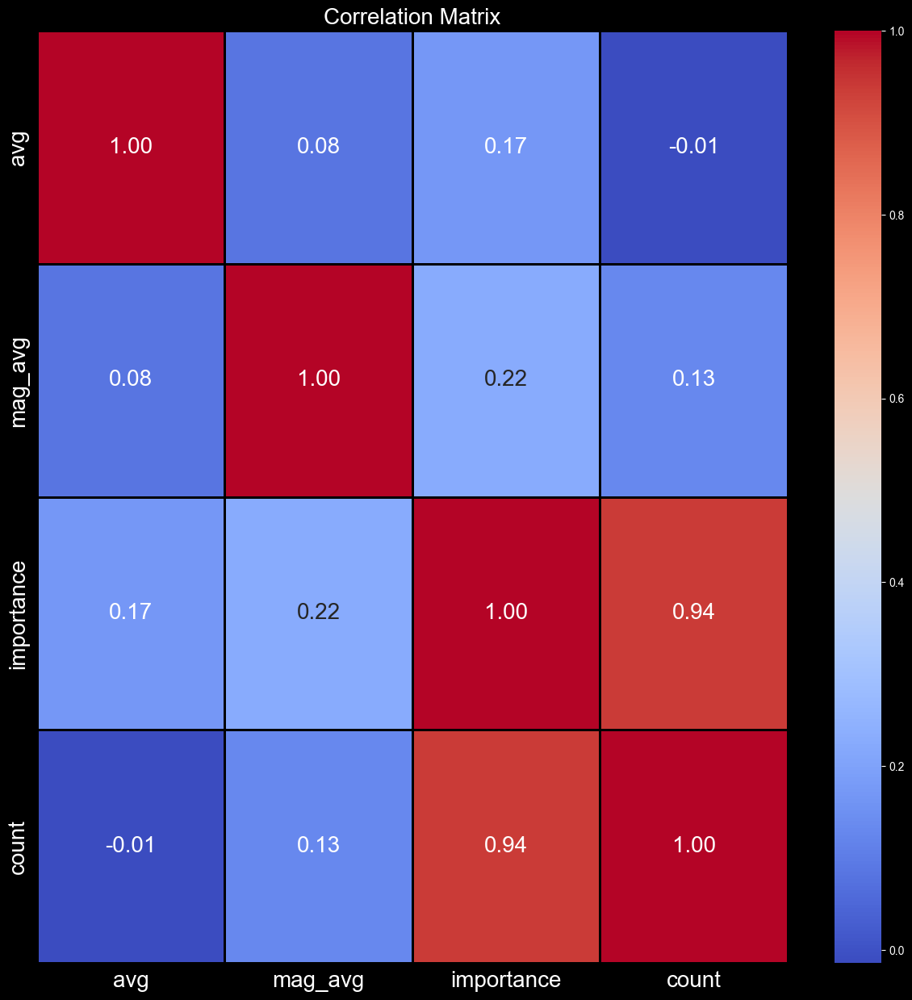

In [410]:
corr = eq_most[['avg', 'mag_avg', 'importance', 'count']].corr()

    
    
#Plot the correlation matrix
plt.figure(figsize=(15,15))
sns.heatmap(corr, annot=True, cmap='coolwarm', linewidths=1, linecolor='black', fmt='.2f', annot_kws={'size':20})

plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
                
plt.title('Correlation Matrix', fontsize=20)
plt.show()


<center> Discussion </center>

<center> <img src="images/fault_lines_names.png" width="50%" /> </center>

<small>

<u> - What is the relationship between the frequency of earthquakes and the population density of a region? </u>

The frequency of earthquakes is not directly related to the population density of a region. However, the population density of a region can be affected by the frequency of earthquakes with the following factors:
- Higher population density usually means more buildings and infrastructure, which can increase the potential for damage and loss of life in the event of an earthquake.
- Areas with high population density may also be more vulnerable to secondary hazards such as landslides (heyelan) or liquefaction (sıvılaşma) which can be triggered by seismic events.
- High population density can also make evacuation and emergency response more challenging in the event of an earthquake, which can increase the overall impact of the disaster.
 

<u> - The spatial distribution of seismic risk: Are there certain regions in Turkey that are more at risk than others? What are the factors that contribute to the spatial distribution of seismic risk?    </u>

There are certain regions in Turkey that are more at risk than others, such as the Aegean and Marmara regions. The factors that contribute to the spatial distribution of seismic risk include the location and depth of the fault lines, the tectonic activity in the region, and the geological characteristics of the area. The urbanization and population growth in these regions have also increased the exposure and vulnerability to seismic events. Furthermore, the inadequate building codes (yapım kuralları) and construction standards in some areas have increased the risk of damage and casualties.

<u> - The impact of earthquake magnitude: How does the magnitude of an earthquake affect the seismic risk for a town? Are there certain towns that are more vulnerable to large earthquakes?        </u>

The magnitude of an earthquake can significantly affect the seismic risk for a town. Larger earthquakes can cause more damage and casualties, especially if the buildings are not constructed to withstand the seismic forces. Certain towns in Turkey are more vulnerable to large earthquakes due to their proximity to active fault lines, such as the towns located along the North and East Fault Zones.

<center>
<small>

📌 Çan - Çanakkale

📌 Yeşilova - Burdur

📌 Gediz - Kütahya

📌 Doğanşehir - Malatya

📌 Orta - Tokat

📌 Pütürge - Malatya

📌 Çat - Erzurum

📌 Karlıova - Bingöl

📌 Akyazı - Sakarya

📌 Kaş - Antalya
</small>
</center>

<u> - The effectiveness of earthquake preparedness and response measures: What are the existing earthquake preparedness and response measures in Turkey? How effective are these measures in reducing the impact of seismic events?     </u>

Turkey has implemented several earthquake preparedness and response measures, including seismic hazard mapping, earthquake drills (tatbikat), and emergency response plans. However, the effectiveness of these measures in reducing the impact of seismic events depends on their implementation and enforcement. There have been instances of inadequate building codes and construction standards, as well as insufficient emergency response measures, which have led to increased damage and casualties during earthquakes. Therefore, there is a need for continuous improvement and updating of earthquake preparedness and response measures to reduce the impact of seismic events in Turkey.

</small>

------------------------------------------------------------------------------------------------------------------------------------

## Phase 3

<u>Tectonic plate boundaries data: </u>

 Tectonic plate boundaries are the boundaries between the Earth's tectonic plates, and they can indicate areas where earthquakes
 are more likely to occur. By incorporating data on tectonic plate boundaries, we can identify regions that are at high risk for earthquakes based on their proximity to plate boundaries. 

This can help identify areas where the risk of earthquakes is high based on a combination of factors such as proximity to plate boundaries, frequency of earthquakes, and population density.

Earthquakes are more common at plate boundaries because tectonic plates are constantly moving and interacting with each other. When plates collide or slide past each other, they can create stress and tension in the Earth's crust. This stress builds up over time until it is released suddenly in the form of an earthquake.

* The most powerful and destructive earthquakes often occur at plate boundaries, where the movement and interaction of tectonic plates are the most intense.

In [411]:
boundaries = pd.read_csv('data/all.csv')

In [412]:
boundaries.head()

,plate,lat,lon
0,am,30.754,132.824
1,am,30.970,132.965
2,am,31.216,133.197
3,am,31.515,133.500
4,am,31.882,134.042


In [413]:
#Lat-long coorditates for cities in Turkey are in range: Latitude from 35.9025 to 42.02683 and longitude from 25.90902 to 44.5742.



tr_boundaries = boundaries[(boundaries['lat'] > 35.9025) & (boundaries['lat'] < 42.02683) & (boundaries['lon'] > 25.90902) & (boundaries['lon'] < 44.5742)]


In [414]:
tr_boundaries

,plate,lat,lon
1035,ar,36.015,44.515
1036,ar,36.572,44.357
1037,ar,37.098,44.020
1038,ar,37.407,43.648
1039,ar,37.685,43.176
...,...,...,...
3517,eu,37.098,44.020
3518,eu,36.572,44.357
3519,eu,36.015,44.515
7346,nu,36.023,36.413


In [415]:
#Check for the number of unique plates and their distribution for Turkey

tr_boundaries['plate'].value_counts()

AT    50
eu    35
ar    25
AS    12
nu     2
Name: plate, dtype: int64

<img src="images/plates.png" width="1300" height="1000" />

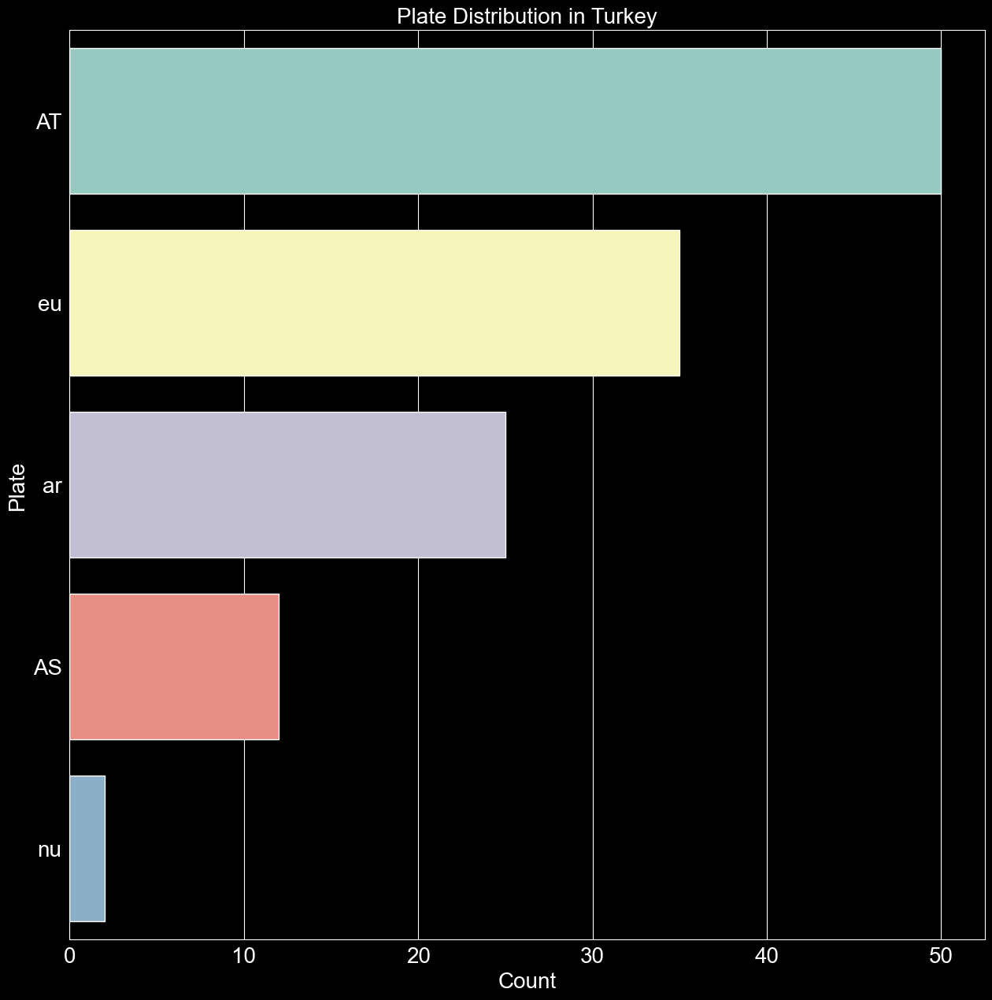

In [416]:
#visualize the distribution of plates in Turkey

plt.figure(figsize=(15,15))
sns.countplot(y='plate', data=tr_boundaries, order=tr_boundaries['plate'].value_counts().index)
plt.title('Plate Distribution in Turkey', fontsize=20)
plt.xlabel('Count', fontsize=20)
plt.ylabel('Plate', fontsize=20)            
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.show()

AT: Anatolia

eu: Eurasia

ar: Arabia

AS: Aegean Sea

nu: ??? 


In [417]:
#AT, eu, ar, AS are the plates that are mostly in Turkey
#Create a new dataframe for these plates
tr_polygon = boundaries[boundaries['plate'].isin(['AT', 'eu', 'ar', 'AS'])]

In [418]:
tr_polygon

,plate,lat,lon
993,ar,24.382,65.028
994,ar,24.350,64.162
995,ar,24.285,63.366
996,ar,24.283,62.581
997,ar,24.087,61.955
...,...,...,...
4422,eu,40.079,-29.580
4423,eu,40.033,-29.613
4424,eu,39.993,-29.609
4425,eu,39.400,-29.770


In [419]:
eq_most_10

,town,mag,count,city_x,latitude_x,longitude_x,latitude_y,longitude_y,city_y,avg,importance,city,mag_avg
20,Çan,"[6.23, 5.82, 5.34, 5.35, 5.43, 7.5, 7.6, 6.74,...",22,Çanakkale,40.396,27.402,40.0333,27.0500,ÇANAKKALE,47988.5,10.000000,Çanakkale,5.747727
17,Yeşilova,"[5.39, 5.97, 5.84, 5.28, 5.39, 5.47, 5.17, 6.3...",18,Burdur,37.484,29.813,38.4095,33.8380,BURDUR,14638.0,4.840636,Burdur,5.403333
6,Gediz,"[7.23, 5.25, 5.11, 5.15, 5.99, 5.23]",6,Kütahya,39.098,29.570,38.9939,29.3913,KÜTAHYA,50126.5,2.843189,Kütahya,5.660000
4,Doğanşehir,"[6.1, 5.8, 5.0, 6.0, 5.8, 5.7, 5.3]",7,Malatya,37.993,37.806,38.0857,37.8712,MALATYA,37916.5,2.044774,Malatya,5.671429
12,Orta,"[6.31, 5.73, 5.51, 5.17, 5.17, 5.2, 6.0]",7,Sivas,40.406,38.098,40.6242,33.1093,ÇANKIRI,12910.5,1.911808,Sivas,5.584286
14,Pütürge,"[6.8, 5.18, 5.1, 5.1, 5.6, 5.4]",6,Malatya,38.153,38.645,38.1992,38.8630,MALATYA,12734.0,1.892262,Malatya,5.530000
22,Çat,"[5.44, 6.78, 5.81, 5.36, 6.23, 5.7, 5.9, 5.5]",8,Van,38.009,42.897,39.6064,40.9684,ERZURUM,15897.5,1.483163,Van,5.840000
8,Karlıova,"[5.93, 5.57, 5.3, 5.6, 5.0, 5.3]",6,Muş,39.230,41.374,39.2904,41.0059,BİNGÖL,27696.0,1.320466,Muş,5.450000
1,Akyazı,"[6.02, 5.22, 5.1, 5.0, 5.3]",5,Sakarya,40.620,30.860,40.6850,30.6222,SAKARYA,93790.5,1.217390,Sakarya,5.328000
9,Kaş,"[6.1, 5.6, 5.35, 5.34, 5.5]",5,Isparta,38.364,30.892,36.2018,29.6377,ANTALYA,62177.0,1.191548,Isparta,5.578000


Fault lines and tectonic plates are related in that most fault lines occur at or near plate boundaries, where the movement of one plate against another can cause rocks to break and shift along the fault line. However, not all fault lines are associated with tectonic plate boundaries, and not all tectonic plate boundaries are associated with fault lines

Blue lines represent fault lines, while red lines represent plate boundaries. The heatmap shows the top 10 towns in terms of earthquake danger. The red circles on the map indicate the importance of each town according to my metric. The green markers indicate the top 15 cities with the most damage, in terms of both destroyed homes and loss of life.

In [420]:
import folium 
import geopandas as gpd


points = tr_polygon[['lat', 'lon']].values.tolist()

m = folium.Map(location=[39.42, 35], zoom_start=7, tiles='Stamen Terrain')

folium.PolyLine(points, color="red", weight=2.5, opacity=1).add_to(m)

#Read fault lines GeoJSON file
faults = gpd.read_file('geojson/gem_active_faults.geojson')

#Just take the beetween Turkey coordinates
faults = faults[(faults['geometry'].bounds['minx'] > 25) & (faults['geometry'].bounds['maxx'] < 45) & (faults['geometry'].bounds['miny'] > 35) & (faults['geometry'].bounds['maxy'] < 45)]



#Add fault lines to map
folium.GeoJson(faults, name='Fault Lines').add_to(map)

#Add magnitude as heat map
folium.plugins.HeatMap(eq_most_10[['latitude_x', 'longitude_x', 'mag_avg']].values.tolist(), radius=20).add_to(m)

#Add circle markers for cities
for i in range(0, len(eq_most_10)):
    folium.CircleMarker(location=[eq_most_10.iloc[i]['latitude_x'], eq_most_10.iloc[i]['longitude_x']],
                        radius=eq_most_10.iloc[i]['importance']*10,
                        popup=eq_most_10.iloc[i]['town'],
                        color='crimson',
                        fill=True,
                        fill_color='crimson').add_to(m)
    
    
#Add cities with most damage (df4) as marker
for i in range(0, len(df4)):
    folium.Marker(location=[df4.iloc[i]['latitude'], df4.iloc[i]['longitude']],
                        popup=df4.iloc[i]['city'],
                        icon=folium.Icon(color='green', icon='info-sign')).add_to(m)

folium.GeoJson(faults).add_to(m)


m

<b> Create a base map with plate boundaries and magnitude levels </b>

In [421]:
tr_polygon

,plate,lat,lon
993,ar,24.382,65.028
994,ar,24.350,64.162
995,ar,24.285,63.366
996,ar,24.283,62.581
997,ar,24.087,61.955
...,...,...,...
4422,eu,40.079,-29.580
4423,eu,40.033,-29.613
4424,eu,39.993,-29.609
4425,eu,39.400,-29.770


In [422]:
tr_polygon["plate"].value_counts()

eu    1151
ar     255
AT      70
AS      52
Name: plate, dtype: int64

Lat-long coorditates for cities in Turkey are in range: Latitude from 35.9025 to 42.02683 and longitude from 25.90902 to 44.5742.

In [423]:
#Determine the range of lat_long coordinates for plates in Turkey
tr_polygon['lat'].min(), tr_polygon['lat'].max(), tr_polygon['lon'].min(), tr_polygon['lon'].max()
    

(11.577, 86.805, -35.488, 146.963)

In [424]:
#eu as polygon
eu = tr_polygon[tr_polygon['plate'] == 'eu']

#determine the range of lat_long coordinates for eu plate in Turkey
eu_ranges = eu['lat'].min(), eu['lat'].max(), eu['lon'].min(), eu['lon'].max()

#ar as polygon
ar = tr_polygon[tr_polygon['plate'] == 'ar']

#determine the range of lat_long coordinates for ar plate in Turkey
ar_ranges = ar['lat'].min(), ar['lat'].max(), ar['lon'].min(), ar['lon'].max()

#AS as polygon
AS = tr_polygon[tr_polygon['plate'] == 'AS']

#determine the range of lat_long coordinates for AS plate in Turkey
AS_ranges = AS['lat'].min(), AS['lat'].max(), AS['lon'].min(), AS['lon'].max()

#AT as polygon
AT = tr_polygon[tr_polygon['plate'] == 'AT']

#determine the range of lat_long coordinates for AT plate in Turkey
AT_ranges = AT['lat'].min(), AT['lat'].max(), AT['lon'].min(), AT['lon'].max()

    


In [429]:
eu_ranges, ar_ranges, AS_ranges, AT_ranges  

((14.4, 86.805, -35.488, 146.963),
 (11.577, 39.08, 34.257, 65.028),
 (34.198, 40.156, 20.282, 29.731),
 (34.29, 41.159, 25.416, 41.002))

In [425]:
eq_towns

,town,mag,count,city,latitude,longitude
0,Acıpayam,"[5.45, 5.14, 5.28, 5.7, 5.1]",5,Denizli,37.318,29.562
1,Adaklı,"[5.49, 5.16]",2,Bingöl,39.110,40.582
2,Adanavillage,[5.1],1,Adana,36.719,35.943
3,Adapazarı,"[5.31, 5.65]",2,Sakarya,40.796,30.548
4,Adıyamanvillage,[5.28],1,Adıyaman,37.991,38.529
...,...,...,...,...,...,...
297,Şarkikaraağaç,[5.42],1,Isparta,37.988,31.232
298,Şarköy,"[7.23, 6.72]",2,Tekirdağ,40.730,27.121
299,Şehitkamil,[5.0],1,Adana,37.200,37.300
300,Şenkaya,"[5.4, 5.2]",2,Erzurum,40.545,42.403


In [430]:
tr_boundaries

,plate,lat,lon
1035,ar,36.015,44.515
1036,ar,36.572,44.357
1037,ar,37.098,44.020
1038,ar,37.407,43.648
1039,ar,37.685,43.176
...,...,...,...
3517,eu,37.098,44.020
3518,eu,36.572,44.357
3519,eu,36.015,44.515
7346,nu,36.023,36.413


In [433]:
#According to eu, ar, as, at ranges determine each city's plate eu and ar is main plates, AS and AT is micro plates
def get_plate(lat, lon):
    if lat > ar_ranges[0] and lat < ar_ranges[1] and lon > ar_ranges[2] and lon < ar_ranges[3]:
        if lat > AS_ranges[0] and lat < AS_ranges[1] and lon > AS_ranges[2] and lon < AS_ranges[3]:
            return 'AS'
        elif lat > AT_ranges[0] and lat < AT_ranges[1] and lon > AT_ranges[2] and lon < AT_ranges[3]:
            return 'AT'
        else:
            return 'ar'
    elif lat > eu_ranges[0] and lat < eu_ranges[1] and lon > eu_ranges[2] and lon < eu_ranges[3]:
        if lat > AS_ranges[0] and lat < AS_ranges[1] and lon > AS_ranges[2] and lon < AS_ranges[3]:
            return 'AS'
        elif lat > AT_ranges[0] and lat < AT_ranges[1] and lon > AT_ranges[2] and lon < AT_ranges[3]:
            return 'AT'
        else:
            return 'eu'
        
    else:
        return 'NA'
        
#Apply the function to the dataframe
eq_towns['plate'] = eq_towns.apply(lambda x: get_plate(x['latitude'], x['longitude']), axis=1)
eq_towns["plate"].value_counts()

    
    

AT    174
AS     71
eu     39
ar     18
Name: plate, dtype: int64

In [434]:
eq_towns

,town,mag,count,city,latitude,longitude,plate
0,Acıpayam,"[5.45, 5.14, 5.28, 5.7, 5.1]",5,Denizli,37.318,29.562,AS
1,Adaklı,"[5.49, 5.16]",2,Bingöl,39.110,40.582,AT
2,Adanavillage,[5.1],1,Adana,36.719,35.943,AT
3,Adapazarı,"[5.31, 5.65]",2,Sakarya,40.796,30.548,AT
4,Adıyamanvillage,[5.28],1,Adıyaman,37.991,38.529,AT
...,...,...,...,...,...,...,...
297,Şarkikaraağaç,[5.42],1,Isparta,37.988,31.232,AT
298,Şarköy,"[7.23, 6.72]",2,Tekirdağ,40.730,27.121,AT
299,Şehitkamil,[5.0],1,Adana,37.200,37.300,AT
300,Şenkaya,"[5.4, 5.2]",2,Erzurum,40.545,42.403,eu


In [437]:
#For eq_towns mag list calculate the average
eq_towns['mag_avg'] = eq_towns['mag'].apply(lambda x: np.mean(x))
eq_towns

,town,mag,count,city,latitude,longitude,plate,mag_avg
0,Acıpayam,"[5.45, 5.14, 5.28, 5.7, 5.1]",5,Denizli,37.318,29.562,AS,5.334
1,Adaklı,"[5.49, 5.16]",2,Bingöl,39.110,40.582,AT,5.325
2,Adanavillage,[5.1],1,Adana,36.719,35.943,AT,5.100
3,Adapazarı,"[5.31, 5.65]",2,Sakarya,40.796,30.548,AT,5.480
4,Adıyamanvillage,[5.28],1,Adıyaman,37.991,38.529,AT,5.280
...,...,...,...,...,...,...,...,...
297,Şarkikaraağaç,[5.42],1,Isparta,37.988,31.232,AT,5.420
298,Şarköy,"[7.23, 6.72]",2,Tekirdağ,40.730,27.121,AT,6.975
299,Şehitkamil,[5.0],1,Adana,37.200,37.300,AT,5.000
300,Şenkaya,"[5.4, 5.2]",2,Erzurum,40.545,42.403,eu,5.300


<b>  How to calculate the proximity of a town to a tectonic plate boundary? </b>   

1-) Calculate the distance between the town and the nearest tectonic plate boundary by using the Haversine formula.

In [443]:
from haversine import haversine


#For each country find the closest tectonic plate boundary coordinates
def get_closest_boundary(lat, lon):
    closest = 1000
    closest_lat = 0
    closest_lon = 0
    for i in range(0, len(tr_boundaries)):
        distance = haversine((lat, lon), (tr_boundaries.iloc[i]['lat'], tr_boundaries.iloc[i]['lon']))
        if distance < closest:
            closest = distance
            closest_lat = tr_boundaries.iloc[i]['lat']
            closest_lon = tr_boundaries.iloc[i]['lon']
    return closest_lat, closest_lon

#Apply the function to the dataframe
eq_towns['closest_boundary'] = eq_towns.apply(lambda x: get_closest_boundary(x['latitude'], x['longitude']), axis=1)
eq_towns

,town,mag,count,city,latitude,longitude,plate,mag_avg,closest_boundary
0,Acıpayam,"[5.45, 5.14, 5.28, 5.7, 5.1]",5,Denizli,37.318,29.562,AS,5.334,"(36.983, 28.411)"
1,Adaklı,"[5.49, 5.16]",2,Bingöl,39.110,40.582,AT,5.325,"(38.857, 40.624)"
2,Adanavillage,[5.1],1,Adana,36.719,35.943,AT,5.100,"(36.73, 36.467)"
3,Adapazarı,"[5.31, 5.65]",2,Sakarya,40.796,30.548,AT,5.480,"(40.601, 30.774)"
4,Adıyamanvillage,[5.28],1,Adıyaman,37.991,38.529,AT,5.280,"(38.121, 38.365)"
...,...,...,...,...,...,...,...,...,...
297,Şarkikaraağaç,[5.42],1,Isparta,37.988,31.232,AT,5.420,"(37.757, 28.278)"
298,Şarköy,"[7.23, 6.72]",2,Tekirdağ,40.730,27.121,AT,6.975,"(40.789, 27.256)"
299,Şehitkamil,[5.0],1,Adana,37.200,37.300,AT,5.000,"(37.512, 37.083)"
300,Şenkaya,"[5.4, 5.2]",2,Erzurum,40.545,42.403,eu,5.300,"(39.08, 41.002)"


In [448]:
#Visualize the closest boundary coordinates on map
m = folium.Map(location=[39.42, 35], zoom_start=7, tiles='Stamen Terrain')

#Add markers for cities
for i in range(0, len(eq_towns)):
    folium.Marker(location=[eq_towns.iloc[i]['latitude'], eq_towns.iloc[i]['longitude']],
                        popup=eq_towns.iloc[i]['town'],
                        icon=folium.Icon(color='green', icon='info-sign')).add_to(m)

#Add circle markers for closest boundary coordinates
for i in range(0, len(eq_towns)):
    folium.CircleMarker(location=[eq_towns.iloc[i]['closest_boundary'][0], eq_towns.iloc[i]['closest_boundary'][1]],
                        radius=15,
                        popup=eq_towns.iloc[i]['town'],
                        color='blue',
                        fill=True,
                        fill_color='blue').add_to(m)
    
folium.GeoJson(faults).add_to(m)

m

2-) Estimate the consequences of earthquakes of different magnitudes based on population density. (importance metric)

In [460]:
eq_towns

,town,mag,count,city,latitude,longitude,plate,mag_avg,closest_boundary
0,Acıpayam,"[5.45, 5.14, 5.28, 5.7, 5.1]",5,Denizli,37.318,29.562,AS,5.334,"(36.983, 28.411)"
1,Adaklı,"[5.49, 5.16]",2,Bingöl,39.110,40.582,AT,5.325,"(38.857, 40.624)"
2,Adanavillage,[5.1],1,Adana,36.719,35.943,AT,5.100,"(36.73, 36.467)"
3,Adapazarı,"[5.31, 5.65]",2,Sakarya,40.796,30.548,AT,5.480,"(40.601, 30.774)"
4,Adıyamanvillage,[5.28],1,Adıyaman,37.991,38.529,AT,5.280,"(38.121, 38.365)"
...,...,...,...,...,...,...,...,...,...
297,Şarkikaraağaç,[5.42],1,Isparta,37.988,31.232,AT,5.420,"(37.757, 28.278)"
298,Şarköy,"[7.23, 6.72]",2,Tekirdağ,40.730,27.121,AT,6.975,"(40.789, 27.256)"
299,Şehitkamil,[5.0],1,Adana,37.200,37.300,AT,5.000,"(37.512, 37.083)"
300,Şenkaya,"[5.4, 5.2]",2,Erzurum,40.545,42.403,eu,5.300,"(39.08, 41.002)"


In [461]:


#Add population by town name
eq_all = pd.merge(eq_towns, towns, on='town')
eq_all


,town,mag,count,city_x,latitude_x,longitude_x,plate,mag_avg,closest_boundary,latitude_y,longitude_y,city_y,avg
0,Acıpayam,"[5.45, 5.14, 5.28, 5.7, 5.1]",5,Denizli,37.3180,29.5620,AS,5.334,"(36.983, 28.411)",37.4239,29.3494,DENİZLİ,55014.5
1,Adaklı,"[5.49, 5.16]",2,Bingöl,39.1100,40.5820,AT,5.325,"(38.857, 40.624)",39.2262,40.4828,BİNGÖL,8142.0
2,Akhisar,"[5.6, 5.2]",2,Balıkesir,39.0724,27.8389,AS,5.400,"(38.876, 27.138)",38.9185,27.8401,MANİSA,176709.5
3,Akkuş,[7.0],1,Ordu,40.9070,36.7440,AT,7.000,"(40.6, 37.062)",40.7931,37.0164,ORDU,21471.0
4,Akpınar,"[6.62, 5.0]",2,Kırşehir,39.5440,33.9110,AT,5.810,"(41.023, 33.405)",37.5739,38.2208,KIRŞEHİR,6993.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...
312,Üzümlü,[5.57],1,None,38.2650,27.9260,AS,5.570,"(38.227, 27.954)",39.7095,39.7002,ERZİNCAN,14003.0
313,Şarköy,"[7.23, 6.72]",2,Tekirdağ,40.7300,27.1210,AT,6.975,"(40.789, 27.256)",40.6140,27.1156,TEKİRDAĞ,33264.0
314,Şehitkamil,[5.0],1,Adana,37.2000,37.3000,AT,5.000,"(37.512, 37.083)",37.0796,37.3800,GAZİANTEP,848360.0
315,Şenkaya,"[5.4, 5.2]",2,Erzurum,40.5450,42.4030,eu,5.300,"(39.08, 41.002)",40.5565,42.3427,ERZURUM,16428.0


In [462]:
def eq_importance(population, magnitude, count):
    return np.log10(population) * (magnitude**2) * count

#Apply the function to the dataframe    
eq_all['importance'] = eq_all.apply(lambda x: eq_importance(x['avg'], x['mag_avg'], x['count']), axis=1)

#scale the importance values
eq_all['importance'] = (eq_all['importance'] - eq_all['importance'].min()) / (eq_all['importance'].max() - eq_all['importance'].min()) * 10
eq_all.drop_duplicates(subset=['town'], inplace=True)
eq_all.sort_values(by='importance', ascending=False)
    

,town,mag,count,city_x,latitude_x,longitude_x,plate,mag_avg,closest_boundary,latitude_y,longitude_y,city_y,avg,importance
297,Çan,"[6.23, 5.82, 5.34, 5.35, 5.43, 7.5, 7.6, 6.74,...",22,Çanakkale,40.3960,27.4020,AT,5.747727,"(40.64, 27.568)",40.0333,27.0500,ÇANAKKALE,47988.5,10.000000
279,Yeşilova,"[5.39, 5.97, 5.84, 5.28, 5.39, 5.47, 5.17, 6.3...",18,Burdur,37.4840,29.8130,AT,5.403333,"(36.983, 28.411)",38.4095,33.8380,BURDUR,14638.0,6.335303
301,Çat,"[5.44, 6.78, 5.81, 5.36, 6.23, 5.7, 5.9, 5.5]",8,Van,38.0090,42.8970,ar,5.840000,"(37.99, 42.797)",39.6064,40.9684,ERZURUM,15897.5,3.185358
75,Doğanşehir,"[6.1, 5.8, 5.0, 6.0, 5.8, 5.7, 5.3]",7,Malatya,37.9930,37.8060,AT,5.671429,"(37.994, 38.042)",38.0857,37.8712,MALATYA,37916.5,2.836880
96,Gediz,"[7.23, 5.25, 5.11, 5.15, 5.99, 5.23]",6,Kütahya,39.0980,29.5700,AS,5.660000,"(38.227, 27.954)",38.9939,29.3913,KÜTAHYA,50126.5,2.451636
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
198,Otlukbeli,[5.4],1,Erzincan,40.0020,40.0690,AT,5.400000,"(39.703, 39.892)",39.9700,40.0187,ERZİNCAN,2534.5,0.022468
263,Uzundere,[5.0],1,Erzurum,40.4390,41.6640,eu,5.000000,"(39.392, 40.449)",40.5322,41.5383,ERZURUM,7712.5,0.016192
22,Arguvan,[5.0],1,Malatya,38.8272,38.0251,AT,5.000000,"(38.121, 38.365)",38.7738,38.2633,MALATYA,6987.0,0.012952
267,Yedisu,[5.18],1,Bingöl,39.4540,40.4890,AT,5.180000,"(39.392, 40.449)",39.4328,40.5337,BİNGÖL,2823.5,0.002336


3-) Calculate distance to the nearest tectonic plate boundary.

<AxesSubplot: >

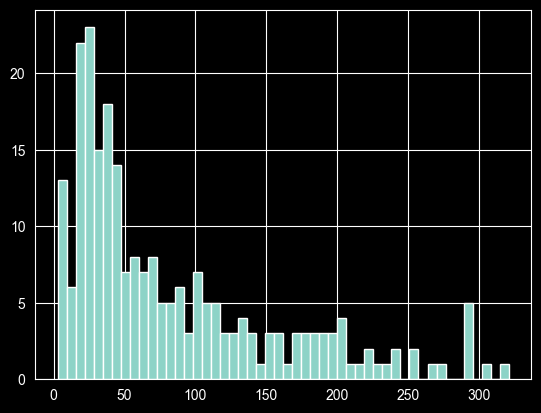

In [465]:
#Haversine formula for distance calculation
from haversine import haversine 

#Distance to closest boundary   
def get_distance(lat, lon, closest_boundary):
    return haversine((lat, lon), (closest_boundary[0], closest_boundary[1]))

#Apply the function to the dataframe
eq_all['distance'] = eq_all.apply(lambda x: get_distance(x['latitude_x'], x['longitude_x'], x['closest_boundary']), axis=1)
eq_all['distance'].hist(bins=50)


<AxesSubplot: >

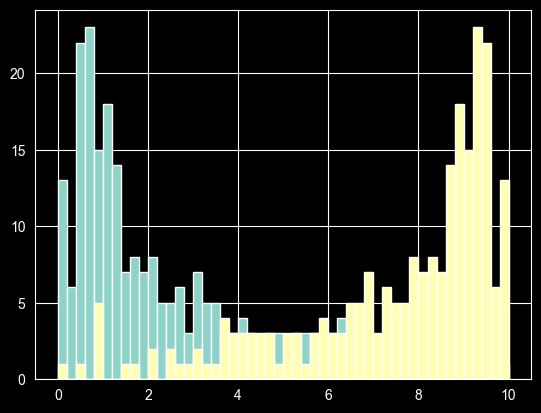

In [467]:
#Closer to boundary, the risk is higher
eq_all['distance'] = (eq_all['distance'] - eq_all['distance'].min()) / (eq_all['distance'].max() - eq_all['distance'].min()) * 10
eq_all['distance'].hist(bins=50)

#Change the scale inversely
eq_all['distance_importance'] = 10 - eq_all['distance']
eq_all['distance_importance'].hist(bins=50)
    


4-) Combine the seismic risk and population density to calculate the overall seismic risk for each town.


In [468]:
#For each city multiply the importance metric with the distance to the nearest tectonic plate boundary by distance_importance
eq_all['final_importance'] = eq_all['importance'] * eq_all['distance_importance']

#Sort the dataframe by final importance 
eq_all.sort_values(by='final_importance', ascending=False)

#Visualize the final importance on map
m = folium.Map(location=[39.42, 35], zoom_start=7, tiles='Stamen Terrain')

#Add markers for cities
for i in range(0, len(eq_all)):
    folium.Marker(location=[eq_all.iloc[i]['latitude_x'], eq_all.iloc[i]['longitude_x']],
                        popup=eq_all.iloc[i]['town'],
                        icon=folium.Icon(color='green', icon='info-sign')).add_to(m)
    
#Add circle markers for closest boundary coordinates
for i in range(0, len(eq_all)):
    folium.CircleMarker(location=[eq_all.iloc[i]['closest_boundary'][0], eq_all.iloc[i]['closest_boundary'][1]],
                        radius=15,
                        popup=eq_all.iloc[i]['town'],
                        color='blue',
                        fill=True,
                        fill_color='blue').add_to(m)
    
folium.GeoJson(faults).add_to(m)

#Add circle markers for cities with final importance
for i in range(0, len(eq_all)):
    folium.CircleMarker(location=[eq_all.iloc[i]['latitude_x'], eq_all.iloc[i]['longitude_x']],
                        radius=eq_all.iloc[i]['final_importance'],
                        popup=eq_all.iloc[i]['town'],
                        color='red',
                        fill=True,
                        fill_color='red').add_to(m)
    
folium.GeoJson(faults).add_to(m)

m